In [1]:
%load_ext autoreload
%autoreload 2

The autoreload module is not an IPython extension.


UsageError: Line magic function `%autoreload` not found.


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import brightway2 as bw
import lca_algebraic as agb
from IPython.display import display
import database_explorer as dbex

In [3]:
bw.projects.current

'default'

In [4]:
bw.projects.set_current('Ecoinvent 3.8')

In [5]:
bw.databases

Databases dictionary with 4 object(s):
	E3 database
	biosphere3
	ecoinvent 3.8 cut-off
	pdb_bioenergy

In [6]:
#Setting brightway environment
bw.projects.set_current('Ecoinvent 3.8')
eidb = bw.Database('ecoinvent 3.8 cut-off')
biodb = bw.Database('biosphere3')

In [7]:
#Choix des catégories d'impacts
methods_EF = [m for m in bw.methods if 'EF v3.0 EN15804' in str(m) 
              and not 'no LT' in str(m) and not 'obsolete' in str(m) ]
methods_CC = [m for m in methods_EF if 'climate' in str(m)]
#Récupération des unités
EF_methods_unit = [bw.Method(m).metadata['unit'] for m in methods_EF]

In [8]:
#Search for bioenergy related datasets in eidb
[act for act in eidb if 'bio' in act['name'] 
 and not 'biogas' in act['name']
 and not 'biomethane' in act['name']
 and not 'biomass' in act['name']
 and not 'biowaste' in act['name']
 and not 'bioethanol' in act['name']
 and not 'biofuel' in act['name']]

['polyester-complexed starch biopolymer production' (kilogram, RoW, None),
 'tap water production, conventional with biological treatment' (kilogram, Europe without Switzerland, None),
 'polyester-complexed starch biopolymer production' (kilogram, RER, None),
 'market for polyester-complexed starch biopolymer' (kilogram, GLO, None),
 'tap water production, conventional with biological treatment' (kilogram, CA-QC, None),
 'tap water production, conventional with biological treatment' (kilogram, RoW, None),
 'tap water production, conventional with biological treatment' (kilogram, CO, None),
 'tap water production, conventional with biological treatment' (kilogram, CH, None)]

To explore :
- biogas,
- biomethane,
- biomass,
- biowaste,
- bioethanol,
- biofuels.

# Sodium carbonqte

In [15]:
list_act = dbex.list_act(database = eidb,
                         name = 'soda ash')
list_act.explore(strict = False, comments = False)

List of names:


{'market for soda ash, dense',
 'market for soda ash, light, crystalline, heptahydrate',
 'soda ash, dense, to generic market for neutralising agent',
 'soda ash, light, crystalline, heptahydrate, to generic market for neutralising agent'}

List of locations:


{'GLO'}

List of units:


{'kilogram'}

market for soda ash, dense (1.000000 kilogram)  \
                                                                                          input   
soda ash, dense                                          modified Solvay process, Hou's process   
soda ash, light, crystalline, heptahydrate                                                  NaN   
soda ash, light, crystalline, heptahydrate#1                                                NaN   
transport, freight train                              market group for transport, freight train   
transport, freight, inland waterways, barge   market group for transport, freight, inland wa...   
transport, freight, lorry, unspecified        market group for transport, freight, lorry, un...   
transport, freight, sea, container ship       market for transport, freight, sea, container ...   

                                                                     \
                                              amount           unit   
soda ash, dense                                  1.0       kilogram   
soda ash, light, crystalline, heptahydrate       NaN            NaN   
soda ash, light, crystalline, heptahydrate#1     NaN            NaN   
transport, freight train                      0.3091  ton kilometer   
transport, freight, inland waterways, barge   0.0246  ton kilometer   
transport, freight, lorry, unspecified        0.2088  ton kilometer   
transport, freight, sea, container ship        0.599  ton kilometer   

                                             market for soda ash, light, crystalline, heptahydrate (1.000000 kilogram)  \
                                                                                                                 input   
soda ash, dense                                                                             NaN                          
soda ash, light, crystalline, heptahydrate                 soda production, solvay process[RER]                          
soda ash, light, crystalline, heptahydrate#1               soda production, solvay process[RoW]                          
transport, freight train                              market group for transport, freight train                          
transport, freight, inland waterways, barge   market group for transport, freight, inland wa...                          
transport, freight, lorry, unspecified        market group for transport, freight, lorry, un...                          
transport, freight, sea, container ship       market for transport, freight, sea, container ...                          

                                                                       \
                                                amount           unit   
soda ash, dense                                    NaN            NaN   
soda ash, light, crystalline, heptahydrate    0.223699       kilogram   
soda ash, light, crystalline, heptahydrate#1  0.776301       kilogram   
transport, freight train                        0.1546  ton kilometer   
transport, freight, inland waterways, barge     0.0246  ton kilometer   
transport, freight, lorry, unspecified          0.1044  ton kilometer   
transport, freight, sea, container ship          0.599  ton kilometer   

                                             soda ash, dense, to generic market for neutralising agent (1.000000 kilogram)  \
                                                                                                                     input   
soda ash, dense                                                      market for soda ash, dense                              
soda ash, light, crystalline, heptahydrate                                                  NaN                              
soda ash, light, crystalline, heptahydrate#1                                                NaN                              
transport, freight train                                                                    NaN                              
tran

All flows:


,"market for soda ash, dense_GLO","market for soda ash, light, crystalline, heptahydrate_GLO","soda ash, dense, to generic market for neutralising agent_GLO","soda ash, light, crystalline, heptahydrate, to generic market for neutralising agent_GLO"
"market group for transport, freight, lorry, unspecified",0.2088,0.1044,NaN,NaN
"market for transport, freight, sea, container ship",0.599,0.599,NaN,NaN
"market group for transport, freight train",0.3091,0.1546,NaN,NaN
"market group for transport, freight, inland waterways, barge",0.0246,0.0246,NaN,NaN
"market for soda ash, dense",1.0,NaN,1.325,NaN
"modified Solvay process, Hou's process",1.0,NaN,NaN,NaN
"market for soda ash, light, crystalline, heptahydrate",NaN,1.0,NaN,1.325
"soda production, solvay process",NaN,1.0,NaN,NaN
"soda ash, dense, to generic market for neutralising agent",NaN,NaN,1.0,NaN
"soda ash, light, crystalline, heptahydrate, to generic market for neutralising agent",NaN,NaN,NaN,1.0


Technosphere flows:


,"market for soda ash, dense_GLO","market for soda ash, light, crystalline, heptahydrate_GLO","soda ash, dense, to generic market for neutralising agent_GLO","soda ash, light, crystalline, heptahydrate, to generic market for neutralising agent_GLO"
"market group for transport, freight, lorry, unspecified",0.2088,0.1044,NaN,NaN
"market for transport, freight, sea, container ship",0.599,0.599,NaN,NaN
"market group for transport, freight train",0.3091,0.1546,NaN,NaN
"market group for transport, freight, inland waterways, barge",0.0246,0.0246,NaN,NaN
"modified Solvay process, Hou's process",1.0,NaN,NaN,NaN
"soda production, solvay process",NaN,1.0,NaN,NaN
"market for soda ash, dense",NaN,NaN,1.325,NaN
"market for soda ash, light, crystalline, heptahydrate",NaN,NaN,NaN,1.325


Biosphere flows:


,"market for soda ash, dense_GLO","market for soda ash, light, crystalline, heptahydrate_GLO","soda ash, dense, to generic market for neutralising agent_GLO","soda ash, light, crystalline, heptahydrate, to generic market for neutralising agent_GLO"


Carbon footprint:


,climate change\nglobal warming potential (GWP100),climate change: biogenic\nglobal warming potential (GWP100),climate change: fossil\nglobal warming potential (GWP100),climate change: land use and land use change\nglobal warming potential (GWP100)
"market for soda ash, dense",1.275908,0.000957,1.273761,0.001190
"market for soda ash, light, crystalline, heptahydrate",0.454614,0.010455,0.443780,0.000379
"soda ash, dense, to generic market for neutralising agent",1.690578,0.001267,1.687734,0.001577
"soda ash, light, crystalline, heptahydrate, to generic market for neutralising agent",0.602364,0.013852,0.588009,0.000503


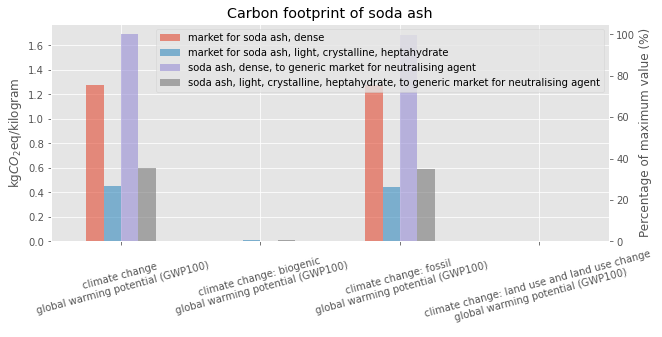

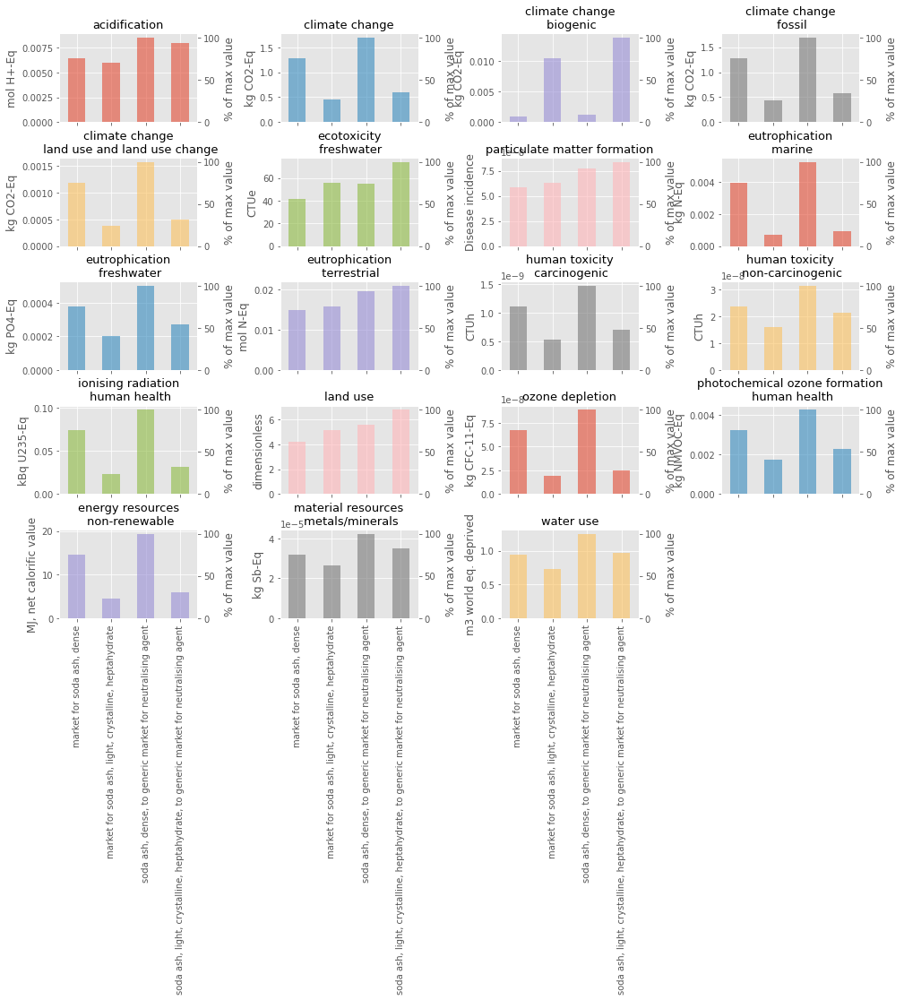

In [16]:
list_act.analyse(methods_CC, methods_EF, print_mode = 3)

In [12]:
agb.multiLCAAlgebric(list_act, methods_CC)

,climate change - global warming potential (GWP100)[kg CO2-Eq],climate change: biogenic - global warming potential (GWP100)[kg CO2-Eq],climate change: fossil - global warming potential (GWP100)[kg CO2-Eq],climate change: land use and land use change - global warming potential (GWP100)[kg CO2-Eq]
"soda ash, light, crystalline, heptahydrate, to generic market for neutralising agent",0.602364,0.013852,0.588009,0.000503
"market for soda ash, light, crystalline, heptahydrate",0.454614,0.010455,0.443780,0.000379
"market for soda ash, dense",1.275908,0.000957,1.273761,0.001190
"soda ash, dense, to generic market for neutralising agent",1.690578,0.001267,1.687734,0.001577


In [13]:
agb.printAct(*list_act)

soda ash, light, crystalline, heptahydrate, to generic market for neutralising agent (1.000000 kilogram)  \
                                                                                                                                                input   
soda ash, dense                                                                             NaN                                                         
soda ash, light, crystalline, heptahydrate    market for soda ash, light, crystalline, hepta...                                                         
soda ash, light, crystalline, heptahydrate#1                                                NaN                                                         
transport, freight train                                                                    NaN                                                         
transport, freight, inland waterways, barge                                                 NaN                                                         
transport, freight, lorry, unspecified                                                      NaN                                                         
transport, freight, sea, container ship                                                     NaN                                                         

                                                               \
                                             amount      unit   
soda ash, dense                                 NaN       NaN   
soda ash, light, crystalline, heptahydrate    1.325  kilogram   
soda ash, light, crystalline, heptahydrate#1    NaN       NaN   
transport, freight train                        NaN       NaN   
transport, freight, inland waterways, barge     NaN       NaN   
transport, freight, lorry, unspecified          NaN       NaN   
transport, freight, sea, container ship         NaN       NaN   

                                             market for soda ash, light, crystalline, heptahydrate (1.000000 kilogram)  \
                                                                                                                 input   
soda ash, dense                                                                             NaN                          
soda ash, light, crystalline, heptahydrate                 soda production, solvay process[RER]                          
soda ash, light, crystalline, heptahydrate#1               soda production, solvay process[RoW]                          
transport, freight train                              market group for transport, freight train                          
transport, freight, inland waterways, barge   market group for transport, freight, inland wa...                          
transport, freight, lorry, unspecified        market group for transport, freight, lorry, un...                          
transport, freight, sea, container ship       market for transport, freight, sea, container ...                          

                                                                       \
                                                amount           unit   
soda ash, dense                                    NaN            NaN   
soda ash, light, crystalline, heptahydrate    0.223699       kilogram   
soda ash, light, crystalline, heptahydrate#1  0.776301       kilogram   
transport, freight train                        0.1546  ton kilometer   
transport, freight, inland waterways, barge     0.0246  ton kilometer   
transport, freight, lorry, unspecified          0.1044  ton kilometer   
transport, freight, sea, container ship          0.599  ton kilometer   

                                                 market for soda ash, dense (1.000000 kilogram)  \
                                                                                          input   
soda ash, dense                                          modified Solvay process, Hou's process   
soda ash, light, crystallin

In [14]:
act = list_act[-1]
print(act)

'soda ash, dense, to generic market for neutralising agent' (kilogram, GLO, None)


In [ ]:
for 

In [9]:
[act for act in eidb if 'sodium' in act['name']]

['market for sodium silicate, solid' (kilogram, RER, None),
 'market for sodium oxide' (kilogram, RER, None),
 'sodium dithionite production, anhydrous' (kilogram, RoW, None),
 'sodium persulfate production' (kilogram, GLO, None),
 'market for sodium chlorate, powder' (kilogram, RER, None),
 'market for sodium dichromate' (kilogram, GLO, None),
 'sodium hydrogen sulfite production' (kilogram, RoW, None),
 'sodium fluoride production' (kilogram, GLO, None),
 'purge gas, rich in sodium nitrate, Recycled Content cut-off' (kilogram, GLO, None),
 'sodium oxide production' (kilogram, RER, None),
 'market for sodium nitrite' (kilogram, RER, None),
 'market for sodium fluoride' (kilogram, GLO, None),
 'market for sodium tetrahydridoborate' (kilogram, GLO, None),
 'sodium phosphate production' (kilogram, RoW, None),
 'sodium nitrate production' (kilogram, RoW, None),
 'sodium borates production' (kilogram, US, None),
 'sodium chloride production, brine solution' (kilogram, RER, None),
 'market 

# Exploration of fertiliser dataset

In [10]:
list_act = dbex.list_act(database = eidb,
                         name = 'fertiliser')
list_act.explore(strict = False, comments = False)

List of names:


{'NPK (15-15-15) fertiliser production',
 'NPK (26-15-15) fertiliser production',
 'catch crop growing, phacelia, September-October, organic fertiliser 40 kg N',
 'catch crop growing, phacelia, September-October, organic fertiliser 60 kg N',
 'catch crop growing, ryegrass, August-April, organic fertiliser 60 kg N, three cuts',
 'catch crop growing, ryegrass, August-April, organic fertiliser 80 kg N, three cuts',
 'catch crop growing, ryegrass, September-April, organic fertiliser 40 kg N, one cut',
 'catch crop growing, ryegrass, September-April, organic fertiliser 60 kg N, one cut',
 'catch crop growing, ryegrass-Egyptian&Persian clover-mixture, August-October, organic fertiliser 30 kg N, one cut',
 'catch crop growing, ryegrass-Egyptian&Persian clover-mixture, August-October, organic fertiliser 30 kg N, two cuts',
 'catch crop growing, ryegrass-Egyptian&Persian clover-mixture, August-October, organic fertiliser 60 kg N, two cuts',
 'catch crop growing, ryegrass-red&Egyptian clover-mix

List of locations:


{'AL',
 'AR',
 'AT',
 'AU',
 'BA',
 'BD',
 'BE',
 'BG',
 'BR',
 'CA',
 'CH',
 'CI',
 'CL',
 'CN',
 'CO',
 'CR',
 'CY',
 'CZ',
 'DE',
 'DK',
 'EC',
 'EE',
 'ES',
 'FI',
 'FR',
 'GB',
 'GLO',
 'GR',
 'HR',
 'HU',
 'ID',
 'IE',
 'IL',
 'IN',
 'IS',
 'IT',
 'KE',
 'LK',
 'LT',
 'LU',
 'LV',
 'MK',
 'MX',
 'MY',
 'NL',
 'NO',
 'NZ',
 'PE',
 'PH',
 'PL',
 'PT',
 'RER',
 'RNA',
 'RO',
 'RS',
 'RU',
 'RoW',
 'SE',
 'SI',
 'SK',
 'TH',
 'TR',
 'UA',
 'US',
 'VN',
 'XK',
 'ZA'}

List of units:


{'hectare', 'kilogram', 'unit'}

## Dataset per hectare

In [11]:
list_act = dbex.list_act(database = eidb,
                         name = 'fertiliser',
                         unit = 'hectare')

list_act.explore(strict = False, 
                 comments = True)

['fertilising, by rig fertiliser, sugarcane' (hectare, RoW, None),
 'market for fertilising, by rig fertiliser, sugarcane' (hectare, GLO, None),
 'planting with starter fertiliser, by no till planter' (hectare, BR, None),
 'fertilising, by rig fertiliser, sugarcane' (hectare, BR, None),
 'market for planting with starter fertiliser, by no till planter' (hectare, GLO, None),
 'planting with starter fertiliser, by no till planter' (hectare, RoW, None)]


List of names:


{'fertilising, by rig fertiliser, sugarcane',
 'market for fertilising, by rig fertiliser, sugarcane',
 'market for planting with starter fertiliser, by no till planter',
 'planting with starter fertiliser, by no till planter'}

List of locations:


{'BR', 'GLO', 'RoW'}

List of units:


{'hectare'}

'fertilising, by rig fertiliser, sugarcane' (hectare, RoW, None)


"This dataset represents the fertilising operation in one hectare (ha). This operation is related to one hectare of the cultural treatments used for the sugarcane culture. Functional Unit (FU) is one hectare of fertiliser application. The operation time is about  2.08  hours per ha (50% of this time is actually worked, discounting time for maintenance, waiting in the field and re-allocations between the plots).\nGeography:  The global dataset is modeled based on information from sugarcane production system in Brazilian South-Cental region.\nTechnology:  This activity is performed with a tractor (power 125 hp; weight 4780 kg) plus a fertilizer broadcaster (weight 850 kg). Life spam of the tractor is considered as 11750 operating hours and of the implement as 10000 operating hours. Machinery used, fuel consumption and operation efficiencies were based on data from sugarcane mills in Brazil, expert's informations and unpublished data.\nTime period:  Most of the data used to modelling this



'market for fertilising, by rig fertiliser, sugarcane' (hectare, GLO, None)


"This is delivering the service of 'fertilising, by rig fertiliser, sugarcane' on an area of one hectare. It includes the use of diesel powered mobile infrastructure (tractors, machinery). Diesel combustion linearly affects direct emissions. Hence, a user can model the right amount of this service by using information on diesel consumption. For example: If within the user's model diesel consumption is 30 kg/ha while in this service it is 15 kg/ha, the user can model with 2 ha of this service.\nThis is a market activity. Each market represents the consumption mix of a product in a given geography, connecting suppliers with consumers of the same product in the same geographical area. Markets group the producers and also the imports of the product (if relevant) within the same geographical area. They also account for transport to the consumer and for the losses during that process, when relevant.\nThis is the market for  'fertilising, by rig fertiliser, sugarcane', in the Global geography



'planting with starter fertiliser, by no till planter' (hectare, BR, None)


'This dataset represents the operation of precision seeding. Seed is not included. The dataset covers the application of seeds and starter fertiliser in the field with a tractor of 250 hp and 10771 kg coupled to an implement that weighs 16000 kg. The functional unit (FU) is one ha seeded. The operation time is 0.21 h/FU and fuel consumption around 18 liters per hour.\n 40 m² are occupied inside the shed. The implement can be used to fertilising besides seeding. In this case, both activities are made in the same operation.\nImage: https://db3.ecoinvent.org/images/df354e48-72e9-4b57-beab-ad99f0af4c63\nGeography:  The inventory is modelled for agricultural processes in Brazil.\nTime period:  Time period of the most of the data collected for this dataset.'



'fertilising, by rig fertiliser, sugarcane' (hectare, BR, None)


"This dataset represents the fertilising operation in one hectare (ha). This operation is related to one hectare of the cultural treatments used for the sugarcane culture. Functional Unit (FU) is one hectare of fertiliser application. The operation time is about  2.08  hours per ha (50% of this time is actually worked, discounting time for maintenance, waiting in the field and re-allocations between the plots).\nGeography:  The dataset is modeled for sugarcane production system in Brazilian South-Cental region.\nTechnology:  This activity is performed with a tractor (power 125 hp; weight 4780 kg) plus a fertilizer broadcaster (weight 850 kg). Life spam of the tractor is considered as 11750 operating hours and of the implement as 10000 operating hours. Machinery used, fuel consumption and operation efficiencies were based on data from sugarcane mills in Brazil, expert's informations and unpublished data.\nTime period:  Most of the data used to modelling this activity were collected in t



'market for planting with starter fertiliser, by no till planter' (hectare, GLO, None)


"This market contains no transport or losses, as they are irrelevant for the delivered product.\nThis is a market activity. Each market represents the consumption mix of a product in a given geography, connecting suppliers with consumers of the same product in the same geographical area. Markets group the producers and also the imports of the product (if relevant) within the same geographical area. They also account for transport to the consumer and for the losses during that process, when relevant.\nThis is the market for  'planting with starter fertiliser, by no till planter', in the Global geography.\nThis is delivering the service of 'planting with starter fertiliser, by no till planter' on an area of one hectare. It includes the use of diesel powered mobile infrastructure (tractors, machinery). Diesel combustion linearly affects direct emissions. Hence, a user can model the right amount of this service by using information on diesel consumption. For example: If within the user's m



'planting with starter fertiliser, by no till planter' (hectare, RoW, None)


'Bibliography is listed below and also the ilustration of the equipment.\nThis dataset represents the operation of precision seeding. Seed is not included. The dataset covers the application of seeds and starter fertiliser in the field with a tractor of 250 hp and 10771 kg coupled to an implement that weighs 16000 kg. The functional unit (FU) is one ha seeded. The operation time is 0.21 h/FU and fuel consumption around 18 liters per hour.\n 40 m² are occupied inside the shed. The implement can be used to fertilising besides seeding. In this case, both activities are made in the same operation.\nMATSUURA, M. I. S. F; PICOLI, J. F.; NOVAES, R. M. L.; DIAS, F. R. T.; HIRAKURI, M. H.; CASTRO, C.; ZORTEA, R. B. Workbook for life cycle inventories of agricultural products. Jaguariúna. Empresa Brasileira de Pesquisa Agropecuária, 2017.\nNemecek & Kagi  (2007) Life Cycle Inventories of Swiss and European Agricultural Production Systems. Final report ecoinvent v2.0 nº 15a. Agroscope Reckenholz 

fertilising, by rig fertiliser, sugarcane[RoW] (1.000000 hectare)  \
                                                                                                               input   
Ammonia                                                                                       Ammonia                  
Benzene                                                                                       Benzene                  
Benzo(a)pyrene                                                                         Benzo(a)pyrene                  
Cadmium                                                                                       Cadmium                  
Cadmium#1                                                                                     Cadmium                  
Carbon dioxide, fossil                                                         Carbon dioxide, fossil                  
Carbon monoxide, fossil                                                       Carbon monoxide, fossil                  
Chromium                                                                                     Chromium                  
Copper                                                                                         Copper                  
Dinitrogen monoxide                                                               Dinitrogen monoxide                  
Lead                                                                                             Lead                  
Methane, fossil                                                                       Methane, fossil                  
NMVOC, non-methane volatile organic compounds, ...  NMVOC, non-methane volatile organic compounds,...                  
Nickel                                                                                         Nickel                  
Nitrogen oxides                                                                       Nitrogen oxides                  
PAH, polycyclic aromatic hydrocarbons                           PAH, polycyclic aromatic hydrocarbons                  
Particulates, < 2.5 um                                                         Particulates, < 2.5 um                  
Selenium                                                                                     Selenium                  
Sulfur dioxide                                                                         Sulfur dioxide                  
Zinc                                                                                             Zinc                  
Zinc#1                                                                                           Zinc                  
agricultural machinery, unspecified                    market for agricultural machinery, unspecified                  
diesel                                                                          market for diesel[CO]                  
diesel#1                                                                        market for diesel[IN]                  
diesel#2                                                                        market for diesel[PE]                  
diesel#3                                                                        market for diesel[ZA]                  
diesel#4                                                                 market group for diesel[RER]                  
diesel#5                                                                       market for diesel[RoW]                  
fertilising, by rig fertiliser, sugarcane                                                         NaN                  
fertilising, by rig fertiliser, sugarcane#1                                                       NaN                  
planting with starter fertiliser, by no till pl...                                                NaN                  
planting with starter fertiliser, by no till pl...                                         

All flows:


,"fertilising, by rig fertiliser, sugarcane_RoW","market for fertilising, by rig fertiliser, sugarcane_GLO","planting with starter fertiliser, by no till planter_BR","fertilising, by rig fertiliser, sugarcane_BR","market for planting with starter fertiliser, by no till planter_GLO","planting with starter fertiliser, by no till planter_RoW"
market for shed,0.002,NaN,0.001891,0.002,NaN,0.001891
"market for tractor, 4-wheel, agricultural",0.847518,NaN,0.38194,0.847518,NaN,0.38194
"market for agricultural machinery, unspecified",0.177083,NaN,2.26944,0.177083,NaN,2.26944
"fertilising, by rig fertiliser, sugarcane",1.0,1.0,NaN,1.0,NaN,NaN
market for diesel,9.204283,NaN,3.266809,10.941766,NaN,2.74806
market group for diesel,1.737483,NaN,NaN,NaN,NaN,0.518748
Zinc,0.001167,NaN,0.000229,0.001167,NaN,0.000229
Dinitrogen monoxide,0.00131,NaN,0.000392,0.00131,NaN,0.000392
Copper,0.000019,NaN,0.000006,0.000019,NaN,0.000006
Nickel,0.000001,NaN,0.0,0.000001,NaN,0.0


Technosphere flows:


,"fertilising, by rig fertiliser, sugarcane_RoW","market for fertilising, by rig fertiliser, sugarcane_GLO","planting with starter fertiliser, by no till planter_BR","fertilising, by rig fertiliser, sugarcane_BR","market for planting with starter fertiliser, by no till planter_GLO","planting with starter fertiliser, by no till planter_RoW"
market for shed,0.002,NaN,0.001891,0.002,NaN,0.001891
"market for tractor, 4-wheel, agricultural",0.847518,NaN,0.38194,0.847518,NaN,0.38194
"market for agricultural machinery, unspecified",0.177083,NaN,2.26944,0.177083,NaN,2.26944
market for diesel,9.204283,NaN,3.266809,10.941766,NaN,2.74806
market group for diesel,1.737483,NaN,NaN,NaN,NaN,0.518748
"fertilising, by rig fertiliser, sugarcane",NaN,1.0,NaN,NaN,NaN,NaN
"planting with starter fertiliser, by no till planter",NaN,NaN,NaN,NaN,1.0,NaN


Biosphere flows:


,"fertilising, by rig fertiliser, sugarcane_RoW","market for fertilising, by rig fertiliser, sugarcane_GLO","planting with starter fertiliser, by no till planter_BR","fertilising, by rig fertiliser, sugarcane_BR","market for planting with starter fertiliser, by no till planter_GLO","planting with starter fertiliser, by no till planter_RoW"
Zinc,0.001167,NaN,0.000229,0.001167,NaN,0.000229
Dinitrogen monoxide,0.00131,NaN,0.000392,0.00131,NaN,0.000392
Copper,0.000019,NaN,0.000006,0.000019,NaN,0.000006
Nickel,0.000001,NaN,0.0,0.000001,NaN,0.0
Nitrogen oxides,0.465,NaN,0.010851,0.465,NaN,0.010851
"PAH, polycyclic aromatic hydrocarbons",0.000036,NaN,0.000011,0.000036,NaN,0.000011
Cadmium,0.000043,NaN,0.000009,0.000043,NaN,0.000009
Sulfur dioxide,0.0111,NaN,0.003299,0.0111,NaN,0.003299
Lead,0.000188,NaN,0.000037,0.000188,NaN,0.000037
"Carbon monoxide, fossil",0.0591,NaN,0.002042,0.0591,NaN,0.002042


Carbon footprint:


,climate change\nglobal warming potential (GWP100),climate change: biogenic\nglobal warming potential (GWP100),climate change: fossil\nglobal warming potential (GWP100),climate change: land use and land use change\nglobal warming potential (GWP100)
"fertilising, by rig fertiliser, sugarcane[RoW]",48.177776,-0.233814,48.391428,0.020162
"market for fertilising, by rig fertiliser, sugarcane",48.091466,-0.233417,48.303810,0.021073
"planting with starter fertiliser, by no till planter[BR]",27.453172,-0.227925,27.633318,0.047778
"fertilising, by rig fertiliser, sugarcane[BR]",47.192233,-0.229288,47.390957,0.030564
"market for planting with starter fertiliser, by no till planter",27.742285,-0.229253,27.926811,0.044727
"planting with starter fertiliser, by no till planter[RoW]",27.747419,-0.229276,27.932022,0.044673


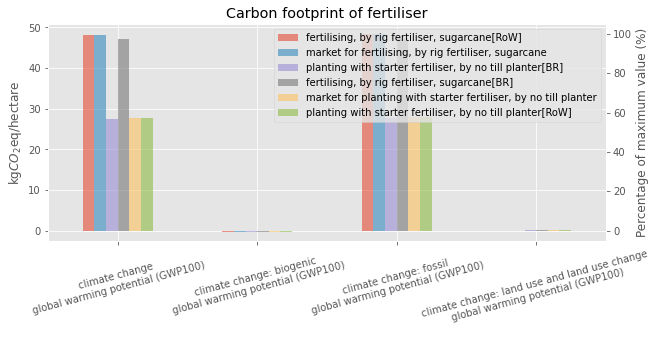

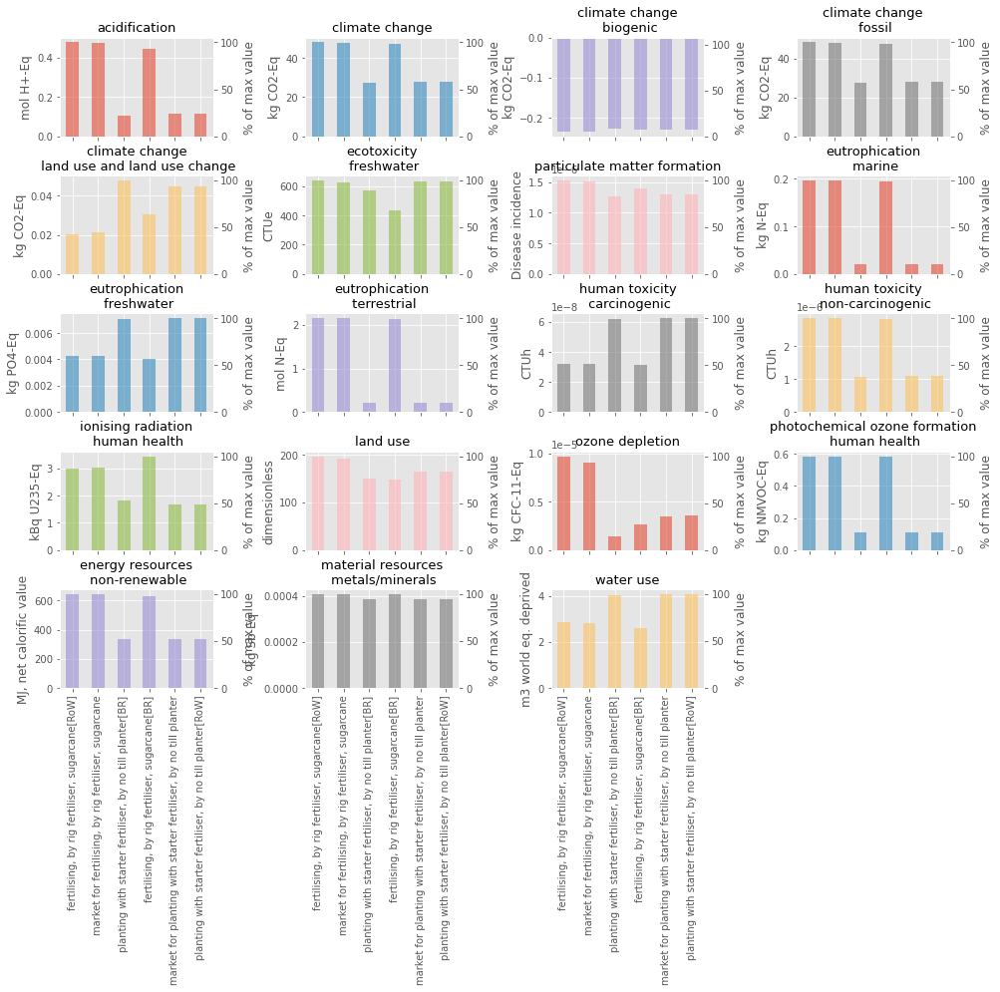

In [12]:
list_act.analyse(methods_CC, methods_EF, print_mode = 3)

'market for fertilising, by rig fertiliser, sugarcane' (hectare, GLO, None)
('EF v3.0 EN15804', 'climate change', 'global warming potential (GWP100)')
('EF v3.0 EN15804', 'climate change: biogenic', 'global warming potential (GWP100)')
('EF v3.0 EN15804', 'climate change: fossil', 'global warming potential (GWP100)')
('EF v3.0 EN15804', 'climate change: land use and land use change', 'global warming potential (GWP100)')


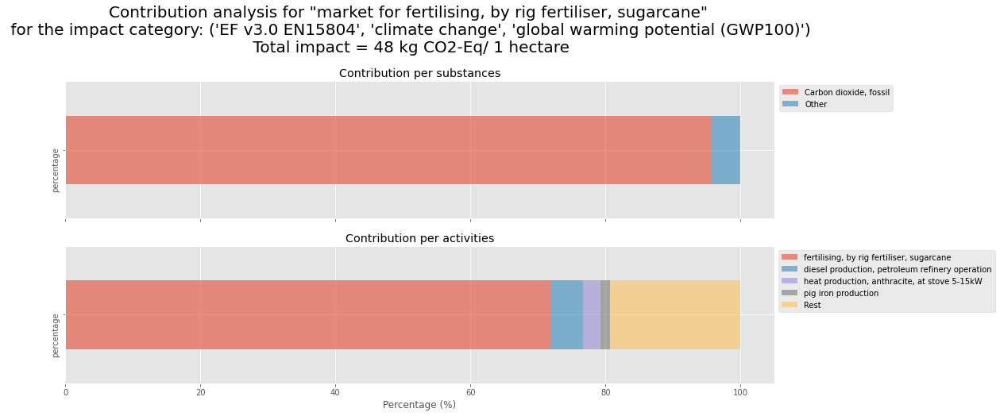

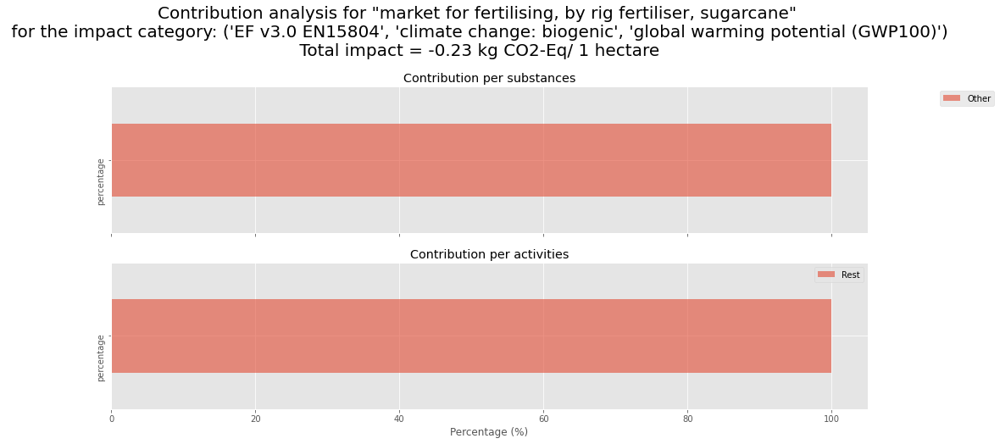

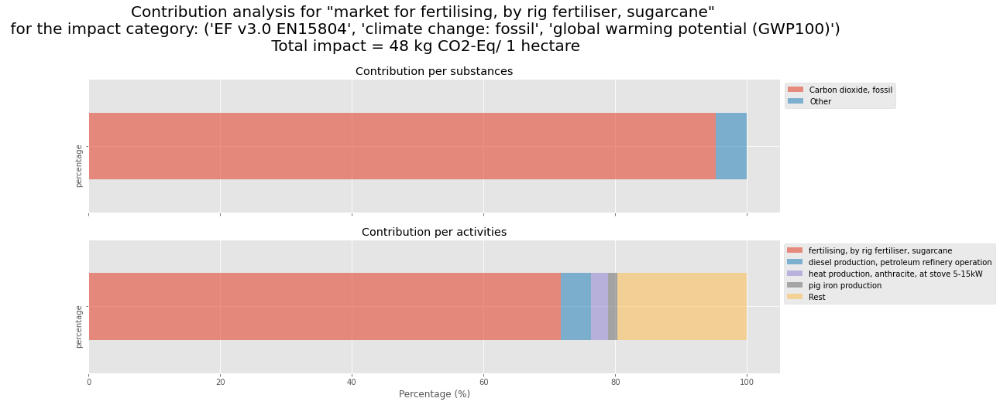

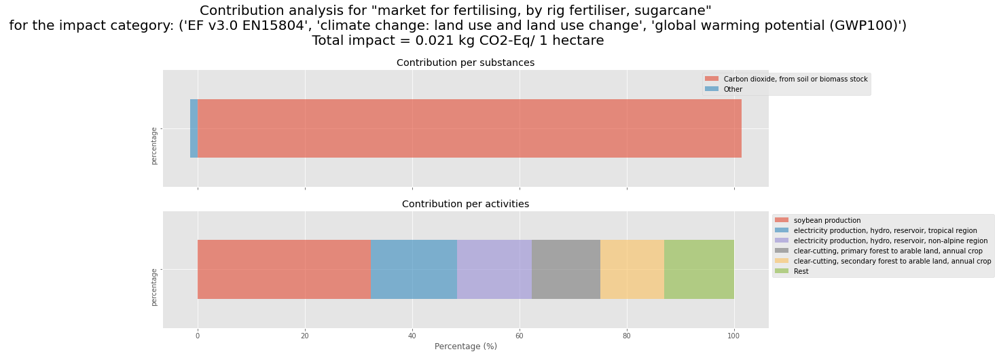

In [13]:
list_act.contribution_analysis(i = 1,
                               methods = methods_CC,
                               save = True) 

'planting with starter fertiliser, by no till planter' (hectare, BR, None)
('EF v3.0 EN15804', 'climate change', 'global warming potential (GWP100)')
('EF v3.0 EN15804', 'climate change: biogenic', 'global warming potential (GWP100)')
('EF v3.0 EN15804', 'climate change: fossil', 'global warming potential (GWP100)')
('EF v3.0 EN15804', 'climate change: land use and land use change', 'global warming potential (GWP100)')


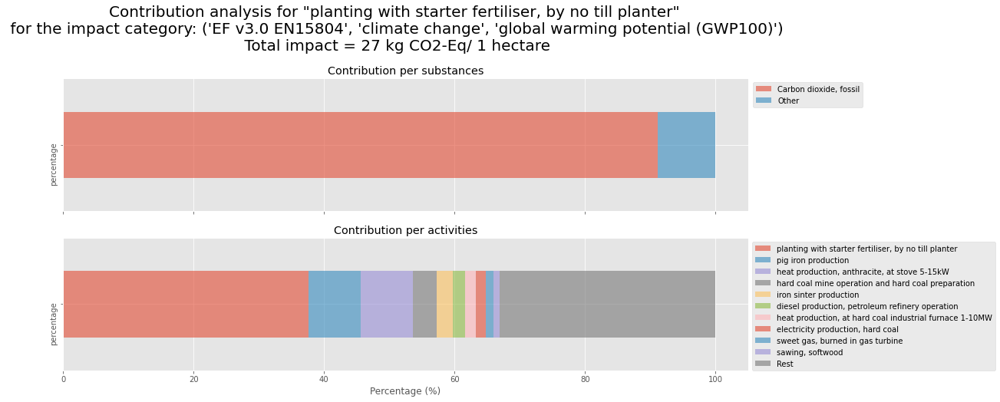

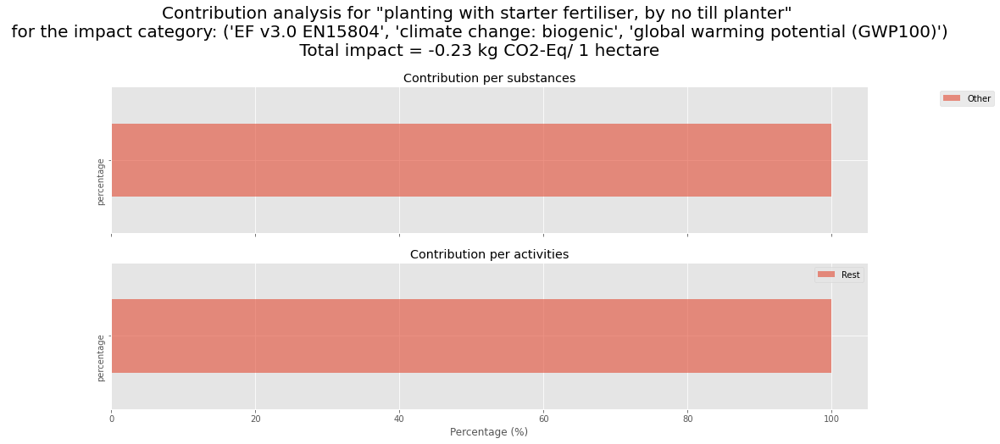

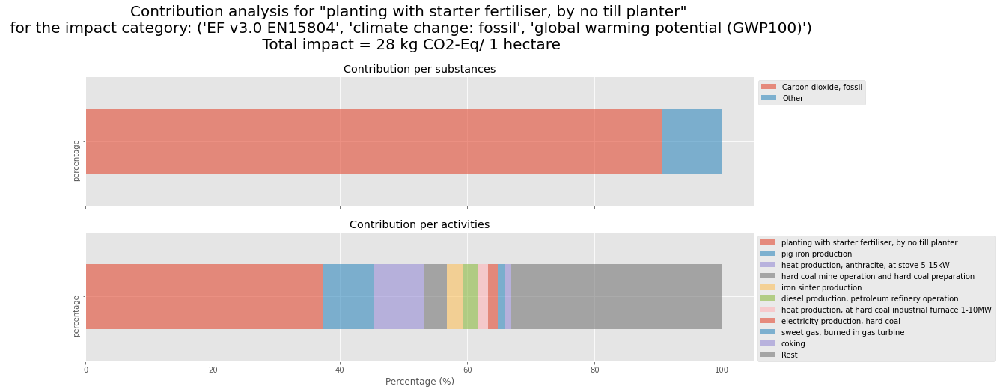

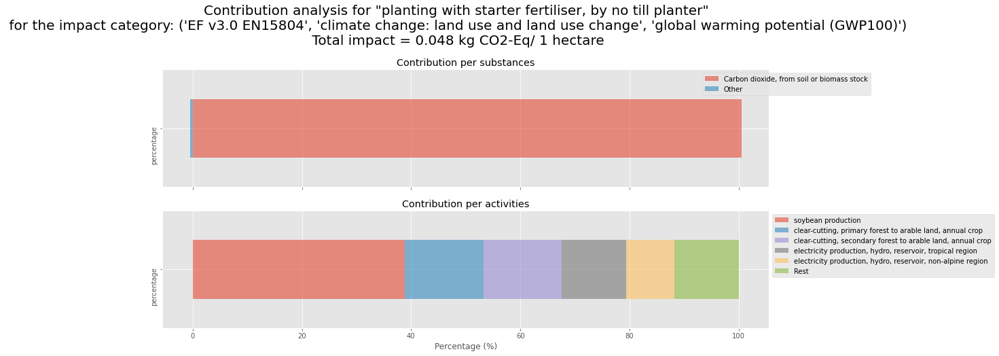

In [14]:
list_act.contribution_analysis(i = 2,
                               methods = methods_CC,
                               save = True) 

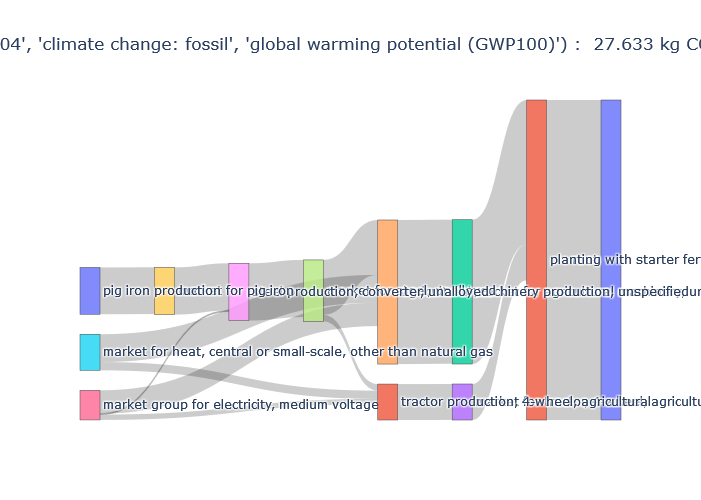

In [15]:
list_act.plot_sankey(i = 2, method = methods_CC[2], cutoff = 0.1)

,label,location,parent,value,value_pct
0,"market for fertilising, by rig fertiliser, sug...",GLO,,48.303810,100.000000
1,"fertilising, by rig fertiliser, sugarcane",BR,"market for fertilising, by rig fertiliser, sug...",4.150265,8.592004
2,"fertilising, by rig fertiliser, sugarcane",RoW,"market for fertilising, by rig fertiliser, sug...",44.153545,91.407996
3,"market for tractor, 4-wheel, agricultural",GLO,"fertilising, by rig fertiliser, sugarcane",6.295316,13.032753
4,market for diesel,RoW,"fertilising, by rig fertiliser, sugarcane",3.722541,7.706517
5,"tractor production, 4-wheel, agricultural",RoW,"market for tractor, 4-wheel, agricultural",6.887792,14.259314
6,"diesel production, petroleum refinery operation",RoW,"fertilising, by rig fertiliser, sugarcane",0.604229,1.250893
7,market for petroleum,GLO,market for diesel,3.572318,7.395521


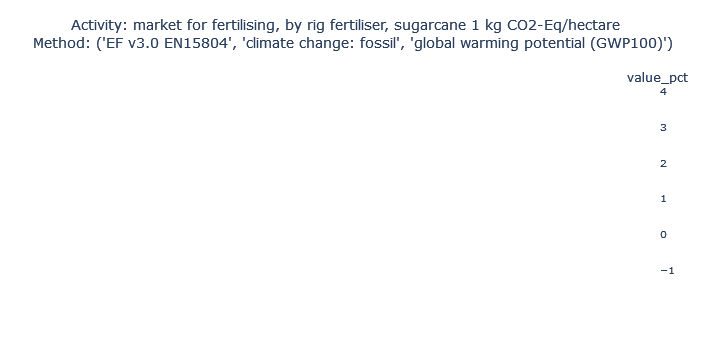

In [16]:
list_act.plot_sunburst(i = 1, method = methods_CC[2], cutoff = 0.05)

Impact of fertilising operation (but without the fertiliser)

## Dataset fertilising

In [ ]:
list_act = dbex.list_act(database = eidb,
                         name = 'fertilising',
                         unit = 'hectare')

list_act.explore(strict = False, 
                 comments = True)

['fertilising, by stool splitter, sugarcane' (hectare, BR, None),
 'fertilising, by broadcaster' (hectare, ZA, None),
 'fertilising, by rig fertiliser, sugarcane' (hectare, BR, None),
 'fertilising, by broadcaster' (hectare, RoW, None),
 'market for fertilising, by rig fertiliser, sugarcane' (hectare, GLO, None),
 'fertilising, by stool splitter, sugarcane' (hectare, RoW, None),
 'market for fertilising, by broadcaster' (hectare, GLO, None),
 'fertilising, by broadcaster' (hectare, Canada without Quebec, None),
 'fertilising, by broadcaster' (hectare, CH, None),
 'fertilising, by broadcaster' (hectare, BR, None),
 'fertilising, by rig fertiliser, sugarcane' (hectare, RoW, None),
 'market for fertilising, by stool splitter, sugarcane' (hectare, GLO, None),
 'fertilising, by broadcaster' (hectare, CA-QC, None)]


List of names:


{'fertilising, by broadcaster',
 'fertilising, by rig fertiliser, sugarcane',
 'fertilising, by stool splitter, sugarcane',
 'market for fertilising, by broadcaster',
 'market for fertilising, by rig fertiliser, sugarcane',
 'market for fertilising, by stool splitter, sugarcane'}

List of locations:


{'BR', 'CA-QC', 'CH', 'Canada without Quebec', 'GLO', 'RoW', 'ZA'}

List of units:


{'hectare'}

'fertilising, by stool splitter, sugarcane' (hectare, BR, None)


"This dataset represents the boiler ashes application operation  in one hectare (ha). The application is done in the furrow by a stool splitter aiming soil fertilization. Functional Unit (FU) is one hectare of fertiliser application. The operation time is about 2.8 hours per ha (37.5% of this time is actually worked, discounting time for maintenance, waiting in the field and re-allocations between the plots).\nGeography:  The dataset is modeled for sugarcane production system in Brazilian South-Cental region.\nTechnology:  This activity is performed with a tractor (power 90 hp; weight 3410 kg) plus  a stool splitter implement (weight 280 kg).  Life spam of this tractor is considered as 13650 operating hours and of the implement as 10000 operating hours. Machinery used, fuel consumption and operation efficiencies were based on data from sugarcane mills in Brazil, expert's informations and unpublished data.\nTime period:  Most of the data used to modelling this activity were collected in



'fertilising, by broadcaster' (hectare, ZA, None)


'Trailed fertiliser broadcaster (pulled by tractor), 500l carrying capacity, fertiliser not included. FU is one ha fertilised..  \n\nChild dataset exchanges scaled from GLO parent dataset based on diesel consumption in South Africa. Created to proxy farm machinery/fieldwork representative of the South African context. Data quality indicators adjusted accordingly. Sulphur dioxide emissions adapted to be representative of South African diesel composition, typically 500ppm sulphur. Other difference with the parent dataset is the production volume, which now represents the production volume in South Africa.\n\nWarning: If the parent value for diesel consumption (in the GLO parent dataset) is changed in future edition, the user must change the parameter "ecoinvent diesel consumption" accordingly in order to get the right ratio of ZA/ecoinvent diesel consumption.\nGeography:  The inventories are based on measurements made by the FAT, in Switzerland.\nTechnology:  Current state of the art in 



'fertilising, by rig fertiliser, sugarcane' (hectare, BR, None)


"This dataset represents the fertilising operation in one hectare (ha). This operation is related to one hectare of the cultural treatments used for the sugarcane culture. Functional Unit (FU) is one hectare of fertiliser application. The operation time is about  2.08  hours per ha (50% of this time is actually worked, discounting time for maintenance, waiting in the field and re-allocations between the plots).\nGeography:  The dataset is modeled for sugarcane production system in Brazilian South-Cental region.\nTechnology:  This activity is performed with a tractor (power 125 hp; weight 4780 kg) plus a fertilizer broadcaster (weight 850 kg). Life spam of the tractor is considered as 11750 operating hours and of the implement as 10000 operating hours. Machinery used, fuel consumption and operation efficiencies were based on data from sugarcane mills in Brazil, expert's informations and unpublished data.\nTime period:  Most of the data used to modelling this activity were collected in t



'fertilising, by broadcaster' (hectare, RoW, None)


'[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports of version 2, which are still available via the ecoinvent website. The change report linked above covers all central changes that were made during the conversion process.]\nFertiliser broadcaster, 500l carrying capacity, fer



'market for fertilising, by rig fertiliser, sugarcane' (hectare, GLO, None)


"This is delivering the service of 'fertilising, by rig fertiliser, sugarcane' on an area of one hectare. It includes the use of diesel powered mobile infrastructure (tractors, machinery). Diesel combustion linearly affects direct emissions. Hence, a user can model the right amount of this service by using information on diesel consumption. For example: If within the user's model diesel consumption is 30 kg/ha while in this service it is 15 kg/ha, the user can model with 2 ha of this service.\nThis is a market activity. Each market represents the consumption mix of a product in a given geography, connecting suppliers with consumers of the same product in the same geographical area. Markets group the producers and also the imports of the product (if relevant) within the same geographical area. They also account for transport to the consumer and for the losses during that process, when relevant.\nThis is the market for  'fertilising, by rig fertiliser, sugarcane', in the Global geography



'fertilising, by stool splitter, sugarcane' (hectare, RoW, None)


"This dataset represents the boiler ashes application operation  in one hectare (ha). The application is done in the furrow by a stool splitter aiming soil fertilization. Functional Unit (FU) is one hectare of fertiliser application. The operation time is about 2.8 hours per ha (37.5% of this time is actually worked, discounting time for maintenance, waiting in the field and re-allocations between the plots).\nGeography:  The global dataset is modeled based on information from sugarcane production system in Brazilian South-Cental region.\nTechnology:  This activity is performed with a tractor (power 90 hp; weight 3410 kg) plus  a stool splitter implement (weight 280 kg).  Life spam of this tractor is considered as 13650 operating hours and of the implement as 10000 operating hours. Machinery used, fuel consumption and operation efficiencies were based on data from sugarcane mills in Brazil, expert's informations and unpublished data.\nTime period:  Most of the data used to modelling th



'market for fertilising, by broadcaster' (hectare, GLO, None)


"This is a market activity. Each market represents the consumption mix of a product in a given geography, connecting suppliers with consumers of the same product in the same geographical area. Markets group the producers and also the imports of the product (if relevant) within the same geographical area. They also account for transport to the consumer and for the losses during that process, when relevant.\nThis is the market for  'fertilising, by broadcaster', in the Global geography.\nThis market contains no transport or losses, as they are irrelevant for the delivered product.\nThis is delivering the service of 'fertilising, by broadcaster' on an area of one hectare. It includes the use of diesel powered mobile infrastructure (tractors, machinery). Diesel combustion linearly affects direct emissions. Hence, a user can model the right amount of this service by using information on diesel consumption. For example: If within the user's model diesel consumption is 30 kg/ha while in this 



'fertilising, by broadcaster' (hectare, Canada without Quebec, None)


'Fertiliser broadcaster, 500l carrying capacity, fertiliser not included. FU is one ha fertilised.\nDataset exchanges scaled from GLO dataset based on diesel consumption in Canada. Created to proxy farm machinery/fieldwork representative of the Canadian context.\nTechnology:  Emissions and fuel consumption by the newest models of tractors set into operation during the period from 1999 to 2001.\nTime period:  Measurements were made in the last few years (1999-2001). Diesel consumption data refer to year of 2019.'



'fertilising, by broadcaster' (hectare, CH, None)


"This dataset represents an example of a typical fertilizing process. Fertiliser broadcaster, 500l carrying capacity. Fertiliser is not included. The functional unit (FU) is one ha fertilized. The operation time is 1.5 h/FU.\n[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports



'fertilising, by broadcaster' (hectare, BR, None)


'This dataset represents the fertilising service. The dataset covers the application of fertiliser with a tractor (120 hp) coupled to an broadcaster (10 t carrying capacity). Functional Unit (FU) is one hectare fertilised.The operation time is 0.07 h/FU and the fuel consumption is 12 liters per hour.\nThis is a common operation in grain production in Brazil.\nImage: https://db3.ecoinvent.org/images/4a77d441-c40d-4bd1-baf7-41ba2cea8ca2\nGeography:  The inventory is modelled for agricultural processes in Brazil.\nTechnology:  Fuel consumption has been extrapolated to Brazil, but emissions per kg diesel and others inputs were taken from the original values.\nTime period:  Most of the data used to modelling this activity were collected in the last few years (2012-2016).'



'fertilising, by rig fertiliser, sugarcane' (hectare, RoW, None)


"This dataset represents the fertilising operation in one hectare (ha). This operation is related to one hectare of the cultural treatments used for the sugarcane culture. Functional Unit (FU) is one hectare of fertiliser application. The operation time is about  2.08  hours per ha (50% of this time is actually worked, discounting time for maintenance, waiting in the field and re-allocations between the plots).\nGeography:  The global dataset is modeled based on information from sugarcane production system in Brazilian South-Cental region.\nTechnology:  This activity is performed with a tractor (power 125 hp; weight 4780 kg) plus a fertilizer broadcaster (weight 850 kg). Life spam of the tractor is considered as 11750 operating hours and of the implement as 10000 operating hours. Machinery used, fuel consumption and operation efficiencies were based on data from sugarcane mills in Brazil, expert's informations and unpublished data.\nTime period:  Most of the data used to modelling this



'market for fertilising, by stool splitter, sugarcane' (hectare, GLO, None)


"This is a market activity. Each market represents the consumption mix of a product in a given geography, connecting suppliers with consumers of the same product in the same geographical area. Markets group the producers and also the imports of the product (if relevant) within the same geographical area. They also account for transport to the consumer and for the losses during that process, when relevant.\nThis is delivering the service of 'fertilising, by stool splitter, sugarcane' on an area of one hectare. It includes the use of diesel powered mobile infrastructure (tractors, machinery). Diesel combustion linearly affects direct emissions. Hence, a user can model the right amount of this service by using information on diesel consumption. For example: If within the user's model diesel consumption is 30 kg/ha while in this service it is 15 kg/ha, the user can model with 2 ha of this service.\nThis is the market for  'fertilising, by stool splitter, sugarcane', in the Global geography



'fertilising, by broadcaster' (hectare, CA-QC, None)


'This dataset represents the service of mineral fertilizing 1 ha of field with a broadcaster of solid fertilizer (4 t carrying capacity) or a liquid nitrogen applicator (3800 L carrying capacity). Fertilizer is not included, nor field emissions from fertilizer application.\nDiesel consumption is calculated from primary data and models from the American Society of Agricultural and Biological Engineers (ASABE) published in 2006 and might be representative of more recent technology than the GLO parent dataset.\nChild dataset exchanges scaled from GLO parent dataset based on diesel consumption in Quebec. Created to proxy farm machinery/fieldwork representative of the Quebec context. Data quality indicators adjusted accordingly. Other difference with the parent dataset is the production volume, which now represents the production volume in Quebec.\nWarning: If the parent value for diesel consumption (in the GLO parent dataset) is changed in future edition, the user must change the parameter

fertilising, by stool splitter, sugarcane[BR] (1.000000 hectare)  \
                                                                                                              input   
Ammonia                                                                                       Ammonia                 
Benzene                                                                                       Benzene                 
Benzo(a)pyrene                                                                         Benzo(a)pyrene                 
Cadmium                                                                                       Cadmium                 
Cadmium#1                                                                                     Cadmium                 
Carbon dioxide, fossil                                                         Carbon dioxide, fossil                 
Carbon monoxide, fossil                                                       Carbon monoxide, fossil                 
Chromium                                                                                     Chromium                 
Copper                                                                                         Copper                 
Dinitrogen monoxide                                                               Dinitrogen monoxide                 
Lead                                                                                             Lead                 
Methane, fossil                                                                       Methane, fossil                 
NMVOC, non-methane volatile organic compounds, ...  NMVOC, non-methane volatile organic compounds,...                 
Nickel                                                                                         Nickel                 
Nitrogen oxides                                                                       Nitrogen oxides                 
PAH, polycyclic aromatic hydrocarbons                           PAH, polycyclic aromatic hydrocarbons                 
Particulates, < 2.5 um                                                         Particulates, < 2.5 um                 
Selenium                                                                                     Selenium                 
Sulfur dioxide                                                                         Sulfur dioxide                 
Zinc                                                                                             Zinc                 
Zinc#1                                                                                           Zinc                 
agricultural machinery, unspecified                    market for agricultural machinery, unspecified                 
diesel                                                                          market for diesel[BR]                 
diesel#1                                                                                          NaN                 
diesel#2                                                                                          NaN                 
diesel#3                                                                                          NaN                 
diesel#4                                                                                          NaN                 
diesel#5                                                                                          NaN                 
fertilising, by broadcaster                                                                       NaN                 
fertilising, by broadcaster#1                                                                     NaN                 
fertilising, by broadcaster#2                                                                     NaN                 
fertilising, by broadcaster#3                                                                     NaN                 
ferti

All flows:


,"fertilising, by stool splitter, sugarcane_BR","fertilising, by broadcaster_ZA","fertilising, by rig fertiliser, sugarcane_BR","fertilising, by broadcaster_RoW","market for fertilising, by rig fertiliser, sugarcane_GLO","fertilising, by stool splitter, sugarcane_RoW","market for fertilising, by broadcaster_GLO","fertilising, by broadcaster_Canada without Quebec","fertilising, by broadcaster_CH","fertilising, by broadcaster_BR","fertilising, by rig fertiliser, sugarcane_RoW","market for fertilising, by stool splitter, sugarcane_GLO","fertilising, by broadcaster_CA-QC"
market for shed,0.002,0.00171,0.002,0.00171,NaN,0.002,NaN,0.00171,NaN,0.00171,0.002,NaN,0.00171
"market for agricultural machinery, unspecified",0.078431,0.241,0.177083,0.241,NaN,0.078431,NaN,0.241,0.241,0.241,0.177083,NaN,0.241
market for diesel,12.117665,2.5,10.941766,5.29,NaN,10.193457,NaN,2.676349,5.29,0.7,9.204283,NaN,2.5
"fertilising, by stool splitter, sugarcane",1.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN
"market for tractor, 4-wheel, agricultural",0.699767,0.687,0.847518,0.687,NaN,0.699767,NaN,0.687,0.687,0.687,0.847518,NaN,0.687
Benzo(a)pyrene,0.000088,0.0,0.0,0.0,NaN,0.000088,NaN,0.0,0.0,0.0,0.0,NaN,0.0
Benzene,0.000088,0.000018,0.00008,0.000039,NaN,0.000088,NaN,0.00002,0.000039,0.000005,0.00008,NaN,0.000018
Zinc,0.001031,0.0009,0.001167,0.000902,NaN,0.001031,NaN,0.0009,0.000902,0.000898,0.001167,NaN,0.0009
Dinitrogen monoxide,0.00145,0.0003,0.00131,0.000635,NaN,0.00145,NaN,0.000321,0.000635,0.000084,0.00131,NaN,0.0003
Cadmium,0.000038,0.0,0.000043,0.0,NaN,0.000038,NaN,0.0,0.0,0.0,0.000043,NaN,0.0


Carbon footprint:


,climate change\nglobal warming potential (GWP100),climate change: biogenic\nglobal warming potential (GWP100),climate change: fossil\nglobal warming potential (GWP100),climate change: land use and land use change\nglobal warming potential (GWP100)
"fertilising, by stool splitter, sugarcane[BR]",49.681613,-0.228965,49.882872,0.027705
"fertilising, by broadcaster[ZA]",16.269326,-0.207361,16.459771,0.016916
"fertilising, by rig fertiliser, sugarcane[BR]",47.192233,-0.229288,47.390957,0.030564
"fertilising, by broadcaster[RoW]",26.516799,-0.203705,26.703151,0.017353
"market for fertilising, by rig fertiliser, sugarcane",48.091466,-0.233417,48.303810,0.021073
"fertilising, by stool splitter, sugarcane[RoW]",50.773072,-0.233977,50.990864,0.016185
"market for fertilising, by broadcaster",26.126619,-0.203821,26.313101,0.017339
"fertilising, by broadcaster[Canada without Quebec]",16.890495,-0.207065,17.080617,0.016943
"fertilising, by broadcaster[CH]",25.887252,-0.069860,25.940084,0.017029
"fertilising, by broadcaster[BR]",9.588527,-0.208711,9.779956,0.017282


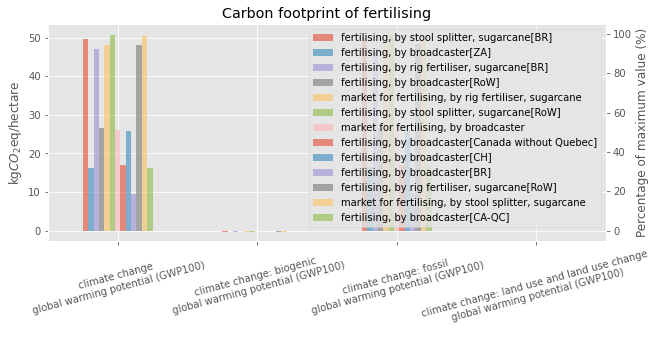

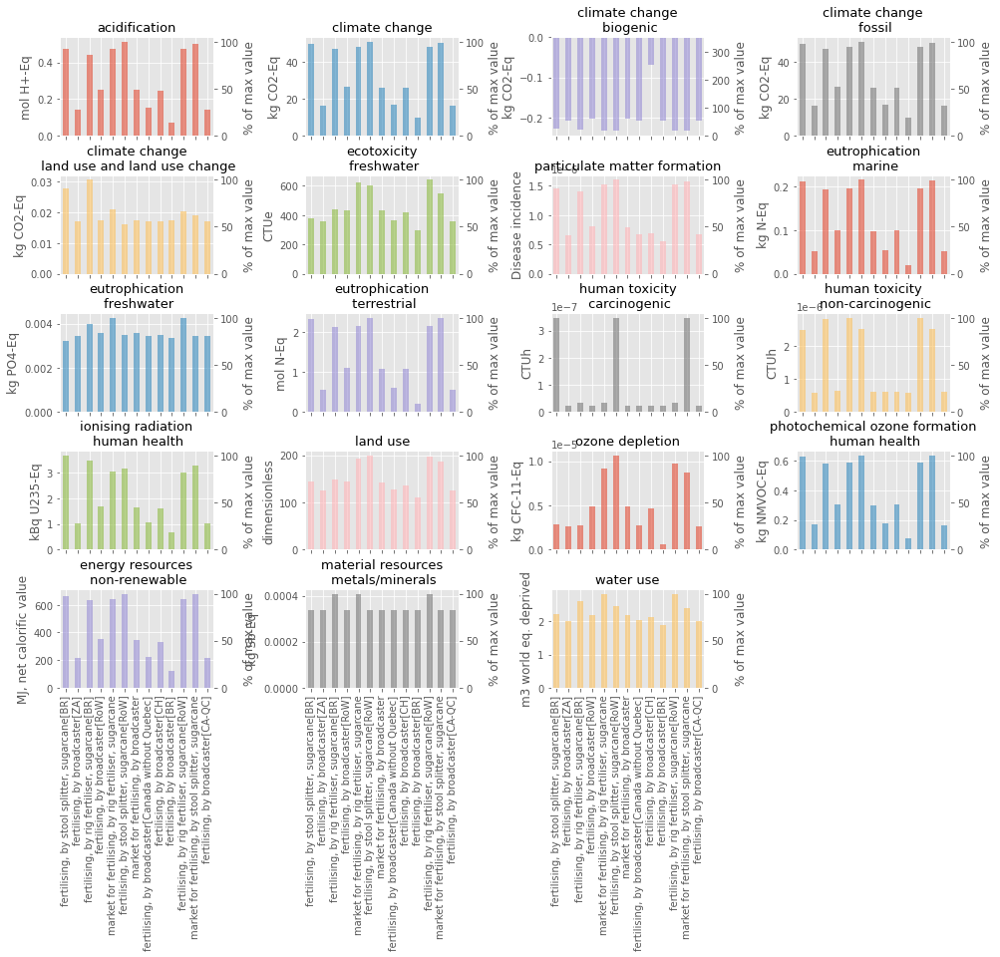

In [152]:
list_act.analyse(methods_CC, methods_EF, print_mode = 2)

## Dataset per unit

In [18]:
list_act = dbex.list_act(database = eidb,
                         name = 'fertiliser',
                         unit = 'unit')

list_act.explore(strict = False, 
                 comments = True)

['phosphoric acid factory construction, fertiliser grade' (unit, RoW, None),
 'phosphoric acid factory construction, fertiliser grade' (unit, US, None),
 'market for phosphoric acid factory, fertiliser grade' (unit, GLO, None)]


List of names:


{'market for phosphoric acid factory, fertiliser grade',
 'phosphoric acid factory construction, fertiliser grade'}

List of locations:


{'GLO', 'RoW', 'US'}

List of units:


{'unit'}

'phosphoric acid factory construction, fertiliser grade' (unit, RoW, None)


"Large uncertainties for equipment used due to weak data from a small pilot plant. Process refers to an phosphoric acid plant using with 65'000 t phosphoric acid (as 100% H3PO4) production per year. Assumed life time 50 years.\n[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent repor



'phosphoric acid factory construction, fertiliser grade' (unit, US, None)


"[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports of version 2, which are still available via the ecoinvent website. The change report linked above covers all central changes that were made during the conversion process.]\nLarge uncertainties for equipment used due to weak 



'market for phosphoric acid factory, fertiliser grade' (unit, GLO, None)


"This is a market activity. In the case of services or immobile infrastructures, markets are connecting suppliers and consumers at a global level. For specific connections at regional level, direct links between the local producing activities and the local consumers are preferred. Transport or losses are logically not relevant for this type of products.\nThis is an immobile infrastructure, representing the construction of phosphoric acid factory, fertiliser grade. The infrastructure is based on average data from a small pilot plant. The yearly output is 65,000 tons phosphoric acid (as 100% H3PO4) to be used as fertilizer and its life time is assumed to be 50 years. The process includes building materials, material for processing equipment, use and occupation for plant, as well as dismanteling  and decommission of plant. \nThis market contains no transport or losses, as they are irrelevant for the delivered product.\nThis is the market for  'phosphoric acid factory, fertiliser grade', i

Correspond to the fertiliser factories.

## Dataset per kilogram

In [20]:
list_act = dbex.list_act(database = eidb,
                         name = 'fertiliser',
                         unit = 'kilogram')

list_act.explore(strict = False, 
                 comments = False)

List of names:


{'NPK (15-15-15) fertiliser production',
 'NPK (26-15-15) fertiliser production',
 'catch crop growing, phacelia, September-October, organic fertiliser 40 kg N',
 'catch crop growing, phacelia, September-October, organic fertiliser 60 kg N',
 'catch crop growing, ryegrass, August-April, organic fertiliser 60 kg N, three cuts',
 'catch crop growing, ryegrass, August-April, organic fertiliser 80 kg N, three cuts',
 'catch crop growing, ryegrass, September-April, organic fertiliser 40 kg N, one cut',
 'catch crop growing, ryegrass, September-April, organic fertiliser 60 kg N, one cut',
 'catch crop growing, ryegrass-Egyptian&Persian clover-mixture, August-October, organic fertiliser 30 kg N, one cut',
 'catch crop growing, ryegrass-Egyptian&Persian clover-mixture, August-October, organic fertiliser 30 kg N, two cuts',
 'catch crop growing, ryegrass-Egyptian&Persian clover-mixture, August-October, organic fertiliser 60 kg N, two cuts',
 'catch crop growing, ryegrass-red&Egyptian clover-mix

List of locations:


{'AL',
 'AR',
 'AT',
 'AU',
 'BA',
 'BD',
 'BE',
 'BG',
 'BR',
 'CA',
 'CH',
 'CI',
 'CL',
 'CN',
 'CO',
 'CR',
 'CY',
 'CZ',
 'DE',
 'DK',
 'EC',
 'EE',
 'ES',
 'FI',
 'FR',
 'GB',
 'GLO',
 'GR',
 'HR',
 'HU',
 'ID',
 'IE',
 'IL',
 'IN',
 'IS',
 'IT',
 'KE',
 'LK',
 'LT',
 'LU',
 'LV',
 'MK',
 'MX',
 'MY',
 'NL',
 'NO',
 'NZ',
 'PE',
 'PH',
 'PL',
 'PT',
 'RER',
 'RNA',
 'RO',
 'RS',
 'RU',
 'RoW',
 'SE',
 'SI',
 'SK',
 'TH',
 'TR',
 'UA',
 'US',
 'VN',
 'XK',
 'ZA'}

List of units:


{'kilogram'}

In [21]:
list_name = ['market for NPK (15-15-15) fertiliser',
 'market for NPK (26-15-15) fertiliser',
 'market for inorganic nitrogen fertiliser, as N',
 'market for inorganic phosphorus fertiliser, as P2O5',
 'market for inorganic potassium fertiliser, as K2O',
 'market for organic nitrogen fertiliser, as N',
 'market for organic phosphorus fertiliser, as P2O5',
 'market for organic potassium fertiliser, as K2O',
 'market for organo-mineral nitrogen fertiliser, as N',
 'market for organo-mineral phosphorus fertiliser, as P2O5',
 'market for organo-mineral potassium fertiliser, as K2O']

In [49]:
list_act_input = [act for act in eidb if act['name'] in list_name
            and act['location'] in ['GLO', 'RoW']]
list_act_input

['market for NPK (15-15-15) fertiliser' (kilogram, RoW, None),
 'market for organic nitrogen fertiliser, as N' (kilogram, GLO, None),
 'market for organo-mineral nitrogen fertiliser, as N' (kilogram, GLO, None),
 'market for organic phosphorus fertiliser, as P2O5' (kilogram, GLO, None),
 'market for inorganic nitrogen fertiliser, as N' (kilogram, RoW, None),
 'market for organo-mineral phosphorus fertiliser, as P2O5' (kilogram, GLO, None),
 'market for organic potassium fertiliser, as K2O' (kilogram, GLO, None),
 'market for organo-mineral potassium fertiliser, as K2O' (kilogram, GLO, None),
 'market for inorganic phosphorus fertiliser, as P2O5' (kilogram, RoW, None),
 'market for inorganic potassium fertiliser, as K2O' (kilogram, RoW, None),
 'market for NPK (26-15-15) fertiliser' (kilogram, RoW, None)]

In [51]:
len(list_act_input)

11

In [52]:
list_act = dbex.list_act(database = eidb,
                         name = 'fertiliser',
                         list_act_input = list_act_input,
                         unit = 'kilogram')

list_act.explore(strict = False, 
                 comments = False)

List of names:


{'market for NPK (15-15-15) fertiliser',
 'market for NPK (26-15-15) fertiliser',
 'market for inorganic nitrogen fertiliser, as N',
 'market for inorganic phosphorus fertiliser, as P2O5',
 'market for inorganic potassium fertiliser, as K2O',
 'market for organic nitrogen fertiliser, as N',
 'market for organic phosphorus fertiliser, as P2O5',
 'market for organic potassium fertiliser, as K2O',
 'market for organo-mineral nitrogen fertiliser, as N',
 'market for organo-mineral phosphorus fertiliser, as P2O5',
 'market for organo-mineral potassium fertiliser, as K2O'}

List of locations:


{'GLO', 'RoW'}

List of units:


{'kilogram'}

market for NPK (15-15-15) fertiliser[RoW] (1.000000 kilogram)  \
                                                                                                    input   
NPK (15-15-15) fertiliser                            NPK (15-15-15) fertiliser production[RoW]              
NPK (26-15-15) fertiliser                                                                  NaN              
inorganic nitrogen fertiliser, as N                                                        NaN              
inorganic nitrogen fertiliser, as N#1                                                      NaN              
inorganic nitrogen fertiliser, as N#10                                                     NaN              
...                                                                                        ...              
transport, freight train#1                             market for transport, freight train[ZA]              
transport, freight train#2                            market for transport, freight train[RoW]              
transport, freight, inland waterways, barge  market for transport, freight, inland waterway...              
transport, freight, lorry, unspecified       market for transport, freight, lorry, unspecif...              
transport, freight, sea, container ship      market for transport, freight, sea, container ...              

                                                                      \
                                               amount           unit   
NPK (15-15-15) fertiliser                         1.0       kilogram   
NPK (26-15-15) fertiliser                         NaN            NaN   
inorganic nitrogen fertiliser, as N               NaN            NaN   
inorganic nitrogen fertiliser, as N#1             NaN            NaN   
inorganic nitrogen fertiliser, as N#10            NaN            NaN   
...                                               ...            ...   
transport, freight train#1                   0.011213  ton kilometer   
transport, freight train#2                   0.220505  ton kilometer   
transport, freight, inland waterways, barge     0.047  ton kilometer   
transport, freight, lorry, unspecified          0.148  ton kilometer   
transport, freight, sea, container ship         0.841  ton kilometer   

                                            market for organic nitrogen fertiliser, as N (1.000000 kilogram)  \
                                                                                                       input   
NPK (15-15-15) fertiliser                                                                  NaN                 
NPK (26-15-15) fertiliser                                                                  NaN                 
inorganic nitrogen fertiliser, as N                                                        NaN                 
inorganic nitrogen fertiliser, as N#1                                                      NaN                 
inorganic nitrogen fertiliser, as N#10                                                     NaN                 
...                                                                                        ...                 
transport, freight train#1                                                                 NaN                 
transport, freight train#2                                                                 NaN                 
transport, freight, inland waterways, barge                                                NaN                 
transport, freight, lorry, unspecified                                                     NaN                 
transport, freight, sea, container ship                                                    NaN                 

                                                         \
                                            amount unit   
NPK (15-15-15) fertiliser                      NaN  NaN   
NPK (26-15-15) fertiliser                      NaN  NaN

All flows:


,market for NPK (15-15-15) fertiliser_RoW,"market for organic nitrogen fertiliser, as N_GLO","market for organo-mineral nitrogen fertiliser, as N_GLO","market for organic phosphorus fertiliser, as P2O5_GLO","market for inorganic nitrogen fertiliser, as N_RoW","market for organo-mineral phosphorus fertiliser, as P2O5_GLO","market for organic potassium fertiliser, as K2O_GLO","market for organo-mineral potassium fertiliser, as K2O_GLO","market for inorganic phosphorus fertiliser, as P2O5_RoW","market for inorganic potassium fertiliser, as K2O_RoW",market for NPK (26-15-15) fertiliser_RoW
"market for transport, freight, inland waterways, barge",0.047,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.047
"market for transport, freight, sea, container ship",0.841,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.841
market for NPK (15-15-15) fertiliser,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"market for transport, freight, lorry, unspecified",0.148,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.148
NPK (15-15-15) fertiliser production,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"market for transport, freight train",0.276,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.276
"market for organic nitrogen fertiliser, as N",NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"nutrient supply from ash, from combustion of straw",NaN,0.000006,NaN,0.000166,NaN,NaN,NaN,NaN,NaN,NaN,NaN
nutrient supply from coconut husk,NaN,0.013614,NaN,0.099962,NaN,NaN,0.00059,NaN,NaN,NaN,NaN
nutrient supply from compost,NaN,0.514596,NaN,0.359862,NaN,NaN,0.286911,NaN,NaN,NaN,NaN


Technosphere flows:


,market for NPK (15-15-15) fertiliser_RoW,"market for organic nitrogen fertiliser, as N_GLO","market for organo-mineral nitrogen fertiliser, as N_GLO","market for organic phosphorus fertiliser, as P2O5_GLO","market for inorganic nitrogen fertiliser, as N_RoW","market for organo-mineral phosphorus fertiliser, as P2O5_GLO","market for organic potassium fertiliser, as K2O_GLO","market for organo-mineral potassium fertiliser, as K2O_GLO","market for inorganic phosphorus fertiliser, as P2O5_RoW","market for inorganic potassium fertiliser, as K2O_RoW",market for NPK (26-15-15) fertiliser_RoW
"market for transport, freight, inland waterways, barge",0.047,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.047
"market for transport, freight, sea, container ship",0.841,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.841
"market for transport, freight, lorry, unspecified",0.148,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.148
NPK (15-15-15) fertiliser production,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"market for transport, freight train",0.276,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.276
"nutrient supply from ash, from combustion of straw",NaN,0.000006,NaN,0.000166,NaN,NaN,NaN,NaN,NaN,NaN,NaN
nutrient supply from coconut husk,NaN,0.013614,NaN,0.099962,NaN,NaN,0.00059,NaN,NaN,NaN,NaN
nutrient supply from compost,NaN,0.514596,NaN,0.359862,NaN,NaN,0.286911,NaN,NaN,NaN,NaN
nutrient supply from fermentation filtrate,NaN,0.000001,NaN,0.000001,NaN,NaN,0.0,NaN,NaN,NaN,NaN
"nutrient supply from filter cake, from sugarcane juice filtration",NaN,0.000114,NaN,0.000193,NaN,NaN,0.000021,NaN,NaN,NaN,NaN


Biosphere flows:


,market for NPK (15-15-15) fertiliser_RoW,"market for organic nitrogen fertiliser, as N_GLO","market for organo-mineral nitrogen fertiliser, as N_GLO","market for organic phosphorus fertiliser, as P2O5_GLO","market for inorganic nitrogen fertiliser, as N_RoW","market for organo-mineral phosphorus fertiliser, as P2O5_GLO","market for organic potassium fertiliser, as K2O_GLO","market for organo-mineral potassium fertiliser, as K2O_GLO","market for inorganic phosphorus fertiliser, as P2O5_RoW","market for inorganic potassium fertiliser, as K2O_RoW",market for NPK (26-15-15) fertiliser_RoW


Carbon footprint:


,climate change\nglobal warming potential (GWP100),climate change: biogenic\nglobal warming potential (GWP100),climate change: fossil\nglobal warming potential (GWP100),climate change: land use and land use change\nglobal warming potential (GWP100)
market for NPK (15-15-15) fertiliser[RoW],1.431558,0.003250,1.425950,0.002358
"market for organic nitrogen fertiliser, as N",0.619176,0.001769,0.615597,0.001810
"market for organo-mineral nitrogen fertiliser, as N",0.000000,0.000000,0.000000,0.000000
"market for organic phosphorus fertiliser, as P2O5",0.286690,0.000816,0.285005,0.000869
"market for inorganic nitrogen fertiliser, as N[RoW]",6.175133,0.015866,6.149593,0.009674
"market for organo-mineral phosphorus fertiliser, as P2O5",0.000000,0.000000,0.000000,0.000000
"market for organic potassium fertiliser, as K2O",0.186990,0.000513,0.185580,0.000897
"market for organo-mineral potassium fertiliser, as K2O",0.000450,0.000001,0.000446,0.000003
"market for inorganic phosphorus fertiliser, as P2O5[RoW]",2.886360,0.005210,2.871285,0.009865
"market for inorganic potassium fertiliser, as K2O[RoW]",3.463277,0.006080,3.451344,0.005853


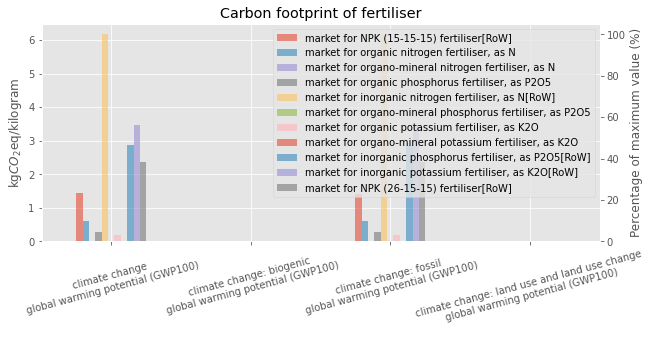

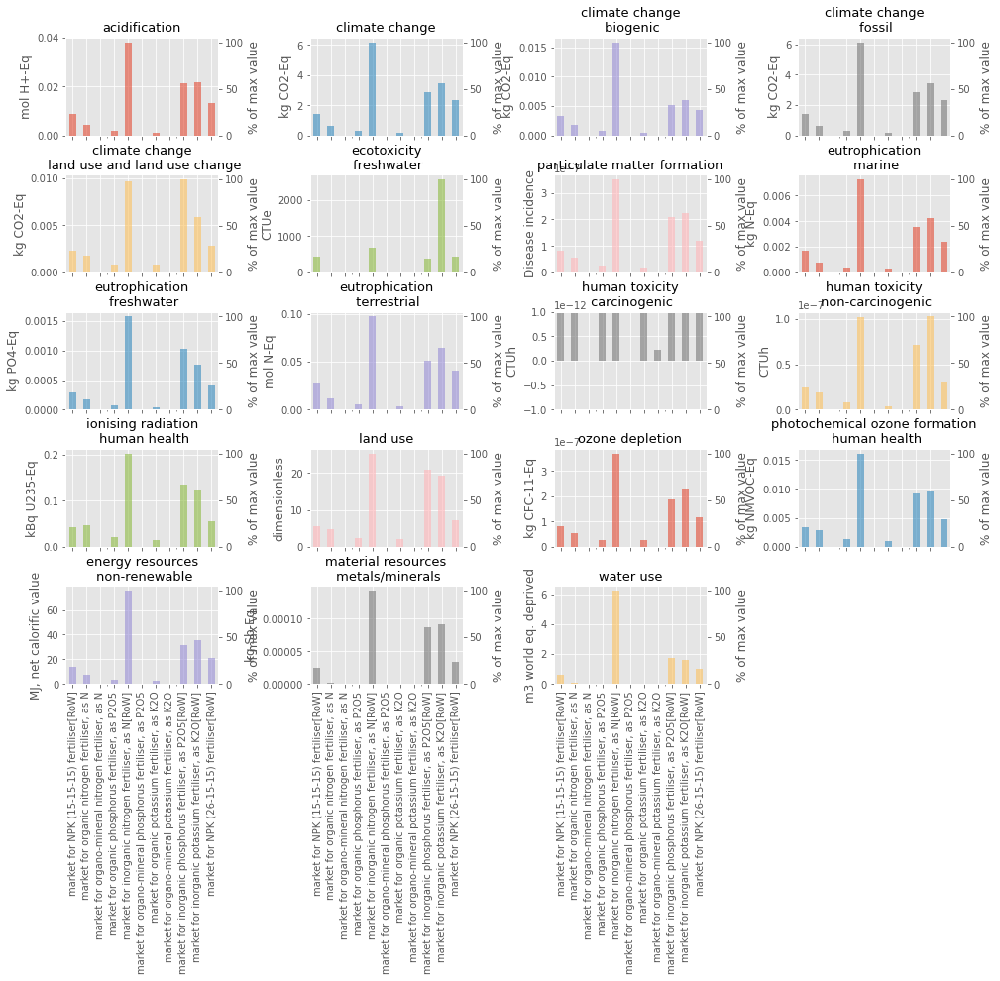

In [53]:
list_act.analyse(methods_CC, methods_EF, print_mode = 3)

### Detailed analysis per dataset

- NPK (market for NPK (15-15-15) fertiliser) : > 20 of CO2eq from N2O, impact mainly from ammonium nitrate production and monoamonium phosphate production
- Organic (market for organic nitrogen fertiliser, as N) : very roughly one quarter transport, one quarter heat (for drying), one quater for electricity, and rest
- 'market for organo-mineral nitrogen fertiliser, as N' and 'market for organo-mineral phosphorus fertiliser, as P2O5' : zéro impact
- market for organo-mineral potassium fertiliser, as K2O :very low impact mainly from transport
- market for organic phosphorus fertiliser, as P2O5 and market for organic potassium fertiliser, as K2O : idem transport heat and electricity and rest.
- inorganic (market for inorganic nitrogen fertiliser, as N, and market for inorganic phosphorus fertiliser, as P2O5) : idem que NPK
- 'market for inorganic potassium fertiliser, as K2O' : impact from ammonium nitrate, potassium chroride and steam.
- 20 - 30% of GHG effect from N2O for inorganic
- 'market for NPK (26-15-15) fertiliser' : 30% of CO2eq from N2O


In [148]:
i = 10
list_act.list_act[i]

'market for NPK (26-15-15) fertiliser' (kilogram, RoW, None)

'market for NPK (26-15-15) fertiliser' (kilogram, RoW, None)
('EF v3.0 EN15804', 'climate change: fossil', 'global warming potential (GWP100)')


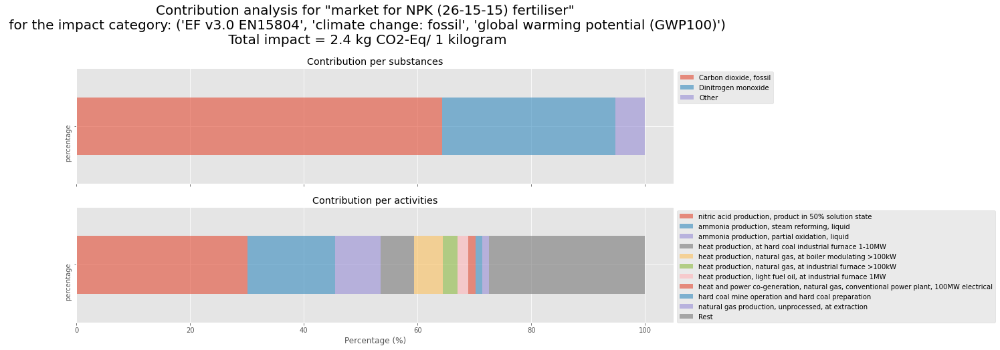

In [145]:
list_act.contribution_analysis(i = i,
                           methods = [methods_CC[2]],
                           save = True)              

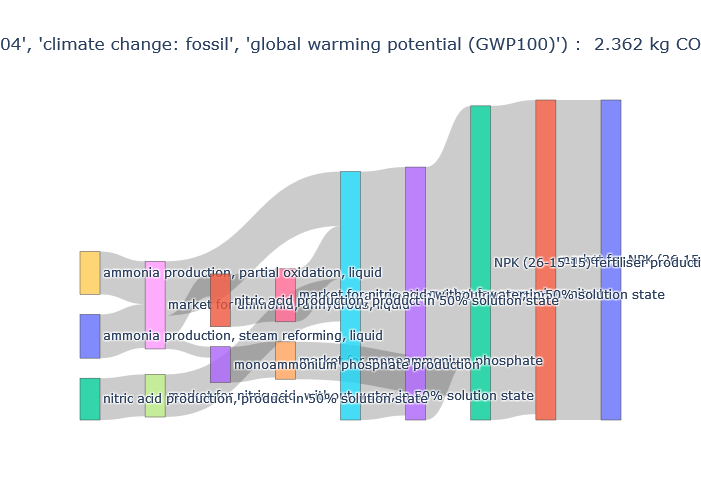

In [146]:
list_act.plot_sankey(i = i,
                      method = methods_CC[2],
                      cutoff = 0.1)       

,label,location,parent,value,value_pct
0,"market for inorganic potassium fertiliser, as K2O",RoW,,3.451344,100.000000
1,nutrient supply from NPK (15-15-15) fertiliser,RoW,"market for inorganic potassium fertiliser, as K2O",2.857224,82.785821
2,market for NPK (15-15-15) fertiliser,RoW,nutrient supply from NPK (15-15-15) fertiliser,2.857224,82.785823
3,NPK (15-15-15) fertiliser production,RoW,market for NPK (15-15-15) fertiliser,2.770630,80.276842
4,market for ammonium nitrate,RoW,NPK (15-15-15) fertiliser production,1.865813,54.060479
5,market for potassium chloride,RoW,NPK (15-15-15) fertiliser production,0.223470,6.474856
6,market for monoammonium phosphate,RoW,NPK (15-15-15) fertiliser production,0.553593,16.039921
7,ammonium nitrate production,RoW,market for ammonium nitrate,1.835012,53.168043
8,"market for ammonia, anhydrous, liquid",RoW,ammonium nitrate production,0.401394,11.630068
9,potassium chloride production,RoW,market for potassium chloride,0.593299,17.190360


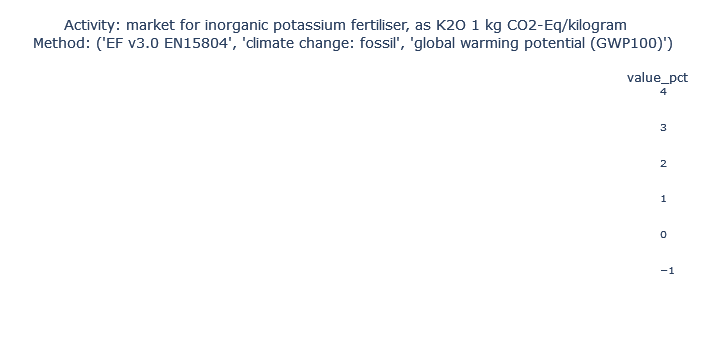

In [132]:
list_act.plot_sunburst(i = i,
                      method = methods_CC[2],
                      cutoff = 0.15)   

# Impact of fertiliser production and operation

In [177]:
list_name = [act['name'] for act in eidb if 'fertilis' in act['name'] and 'hectare' == act['unit']]
list_name

['fertilising, by stool splitter, sugarcane',
 'fertilising, by broadcaster',
 'fertilising, by stool splitter, sugarcane',
 'fertilising, by rig fertiliser, sugarcane',
 'market for fertilising, by stool splitter, sugarcane',
 'fertilising, by broadcaster',
 'fertilising, by broadcaster',
 'fertilising, by rig fertiliser, sugarcane',
 'fertilising, by broadcaster',
 'market for fertilising, by rig fertiliser, sugarcane',
 'fertilising, by broadcaster',
 'fertilising, by broadcaster',
 'market for planting with starter fertiliser, by no till planter',
 'planting with starter fertiliser, by no till planter',
 'planting with starter fertiliser, by no till planter',
 'market for fertilising, by broadcaster']

In [178]:
len(eidb)

19565

In [179]:
list_act = []
for i, act in enumerate(eidb):
    if i%100 == 0:
        print(i)
    for exc in act.exchanges():
        if bw.get_activity(exc['input'])['name'] in list_name:
            print(act)
            list_act.append(act)

0
100
'barley production' (kilogram, DE, None)
'maize silage production' (kilogram, ZA, None)
200
300
'intensive beef cattle production, fat steers only, on pasture' (kilogram, BR, None)
'barley production' (kilogram, FR, None)
'sheep production, for meat' (kilogram, US, None)
400
'coffee green bean production, robusta' (kilogram, BR, None)
'potato production' (kilogram, IN, None)
500
'soybean production, Swiss integrated production, intensive' (kilogram, CH, None)
'beef cattle production on pasture' (kilogram, BR, None)
600
'alfalfa/grass silage production' (kilogram, CA-QC, None)
'barley production' (kilogram, ES, None)
700
'soybean production' (kilogram, CH, None)
'carrot production' (kilogram, NL, None)
'fertilising, by rig fertiliser, sugarcane' (hectare, RoW, None)
'fattening of heifers for beef cattle production, on pasture' (kilogram, RoW, None)
800
'apple production' (kilogram, RoW, None)
'miscanthus rhizome production, for planting' (unit, DE, None)
900
'soybean production' (

KeyboardInterrupt: 

In [184]:
list_act = dbex.list_act(database = eidb,
                         name = 'rape seed production',
                         unit = 'kilogram',
                         location = 'RoW'
                        )

list_act.explore(strict = False, 
                 comments = True)

['rape seed production, organic' (kilogram, RoW, None),
 'rape seed production, organic, for sowing' (kilogram, RoW, None),
 'rape seed production, for sowing' (kilogram, RoW, None),
 'rape seed production' (kilogram, RoW, None)]


List of names:


{'rape seed production',
 'rape seed production, for sowing',
 'rape seed production, organic',
 'rape seed production, organic, for sowing'}

List of locations:


{'RoW'}

List of units:


{'kilogram'}

'rape seed production, organic' (kilogram, RoW, None)


'This dataset represents the production of 1 kg of rape seed (fresh matter). The yield is 2023 kg/ha at a moisture content at storage of 6%.\n\n[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports of version 2, which are still available via the ecoinvent website. The change rep



'rape seed production, organic, for sowing' (kilogram, RoW, None)


'[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports of version 2, which are still available via the ecoinvent website. The change report linked above covers all central changes that were made during the conversion process.]\nRefers to 1 kg seed of rape seed (fresh weight), wi



'rape seed production, for sowing' (kilogram, RoW, None)


'Refers to 1 kg seed of rape seed (fresh weight), with a maximum water content of 6%\n[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports of version 2, which are still available via the ecoinvent website. The change report linked above covers all central changes that were made



'rape seed production' (kilogram, RoW, None)


'[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports of version 2, which are still available via the ecoinvent website. The change report linked above covers all central changes that were made during the conversion process.]\nThis dataset represents the production of 1 kg of r

Error while parsing formula 'CORINE 211b' : backing to amount
Error while parsing formula 'CORINE 211b' : backing to amount
Error while parsing formula 'NO3-' : backing to amount
Error while parsing formula 'CORINE 231a' : backing to amount
Error while parsing formula 'CORINE x' : backing to amount
Error while parsing formula 'CORINE 121a' : backing to amount
Error while parsing formula 'CORINE x' : backing to amount
Error while parsing formula 'CORINE 121a' : backing to amount
Error while parsing formula 'Cu+' : backing to amount
Error while parsing formula 'CORINE 211a' : backing to amount
Error while parsing formula 'C5H13ClN+' : backing to amount
Error while parsing formula 'CORINE 21' : backing to amount
Error while parsing formula 'CORINE 211a' : backing to amount
Error while parsing formula 'NO3-' : backing to amount
Error while parsing formula 'Cu+' : backing to amount
C:\Users\romai\anaconda3\envs\python38\lib\site-packages\lca_algebraic\helpers.py:653: PerformanceWarning:

Da

rape seed production, organic[RoW] (1.000000 kilogram)  \
                                                                                              input   
Ammonia                                                                                 Ammonia       
Cadmium                                                                                 Cadmium       
Cadmium, ion                                                                                NaN       
Cadmium, ion#1                                                                              NaN       
Carbaryl                                                                                    NaN       
...                                                                                         ...       
tillage, harrowing, by spring tine harrow     market for tillage, harrowing, by spring tine ...       
tillage, ploughing                                                market for tillage, ploughing       
transport, tractor and trailer, agricultural  market for transport, tractor and trailer, agr...       
urea                                                                                        NaN       
urea#1                                                                                      NaN       

                                                                       \
                                                amount           unit   
Ammonia                                            H3N       kilogram   
Cadmium                                             Cd       kilogram   
Cadmium, ion                                       NaN            NaN   
Cadmium, ion#1                                     NaN            NaN   
Carbaryl                                           NaN            NaN   
...                                                ...            ...   
tillage, harrowing, by spring tine harrow     0.000989        hectare   
tillage, ploughing                            0.000494        hectare   
transport, tractor and trailer, agricultural    0.0005  ton kilometer   
urea                                               NaN            NaN   
urea#1                                             NaN            NaN   

                                             rape seed production, organic, for sowing[RoW] (1.000000 kilogram)  \
                                                                                                          input   
Ammonia                                                                                     NaN                   
Cadmium                                                                                     NaN                   
Cadmium, ion                                                                                NaN                   
Cadmium, ion#1                                                                              NaN                   
Carbaryl                                                                                    NaN                   
...                                                                                         ...                   
tillage, harrowing, by spring tine harrow                                                   NaN                   
tillage, ploughing                                                                          NaN                   
transport, tractor and trailer, agricultural                                                NaN                   
urea                                                                                        NaN                   
urea#1                                                                                      NaN                   

                                                          \
                                             amount unit   
Ammonia                                         NaN  NaN   
Cadmium                                         NaN  NaN   
Cadmium, ion       

All flows:


,"rape seed production, organic_RoW","rape seed production, organic, for sowing_RoW","rape seed production, for sowing_RoW",rape seed production_RoW
market for sowing,0.000494,NaN,NaN,0.000341
"market for rape seed, organic, for sowing",0.002719,NaN,NaN,NaN
"rape seed production, organic",1.0,NaN,NaN,NaN
"market for solid manure loading and spreading, by hydraulic loader and spreader",14.829,NaN,NaN,NaN
"market for tillage, ploughing",0.000494,NaN,NaN,0.000228
...,...,...,...,...
"Chromium, ion",NaN,NaN,NaN,0.000007
Napropamide,NaN,NaN,NaN,0.000055
Quizalofop-P,NaN,NaN,NaN,0.000001
Dimethachlor,NaN,NaN,NaN,0.000048


Technosphere flows:


,"rape seed production, organic_RoW","rape seed production, organic, for sowing_RoW","rape seed production, for sowing_RoW",rape seed production_RoW
market for sowing,0.000494,NaN,NaN,0.000341
"market for rape seed, organic, for sowing",0.002719,NaN,NaN,NaN
"market for solid manure loading and spreading, by hydraulic loader and spreader",14.829,NaN,NaN,NaN
"market for tillage, ploughing",0.000494,NaN,NaN,0.000228
"market for transport, tractor and trailer, agricultural",0.0005,NaN,NaN,0.002907
market for combine harvesting,0.000494,NaN,NaN,0.000334
"market for drying of bread grain, seed and legumes",0.0681,NaN,NaN,0.009735
"market for liquid manure spreading, by vacuum tanker",0.009886,NaN,NaN,NaN
"market for tillage, currying, by weeder",0.000494,NaN,NaN,NaN
"market for tillage, harrowing, by spring tine harrow",0.000989,NaN,NaN,0.000497


Biosphere flows:


,"rape seed production, organic_RoW","rape seed production, organic, for sowing_RoW","rape seed production, for sowing_RoW",rape seed production_RoW
Zinc,0.000335,NaN,NaN,-0.000002
Water,0.136516,NaN,NaN,0.223433
Mercury,0.000001,NaN,NaN,-0.0
Cadmium,-0.000001,NaN,NaN,0.000001
Nickel,0.000011,NaN,NaN,0.000001
...,...,...,...,...
"Chromium, ion",NaN,NaN,NaN,0.000007
Napropamide,NaN,NaN,NaN,0.000055
Quizalofop-P,NaN,NaN,NaN,0.000001
Dimethachlor,NaN,NaN,NaN,0.000048


Carbon footprint:


,climate change\nglobal warming potential (GWP100),climate change: biogenic\nglobal warming potential (GWP100),climate change: fossil\nglobal warming potential (GWP100),climate change: land use and land use change\nglobal warming potential (GWP100)
"rape seed production, organic[RoW]",-0.934832,-1.984564,1.049378,0.000354
"rape seed production, organic, for sowing[RoW]",-1.508934,-3.472514,1.962444,0.001136
"rape seed production, for sowing[RoW]",-1.418149,-3.255207,1.830402,0.006657
rape seed production[RoW],-0.967060,-1.982020,1.014255,0.000705


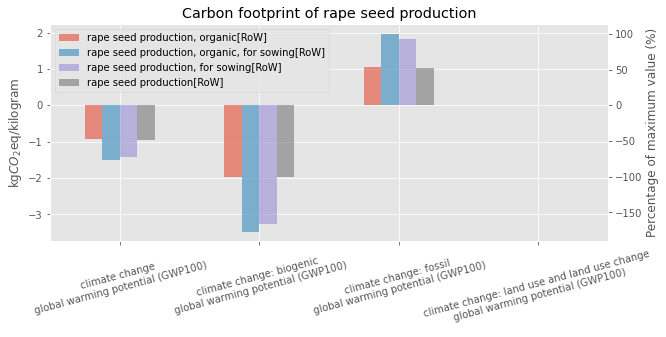

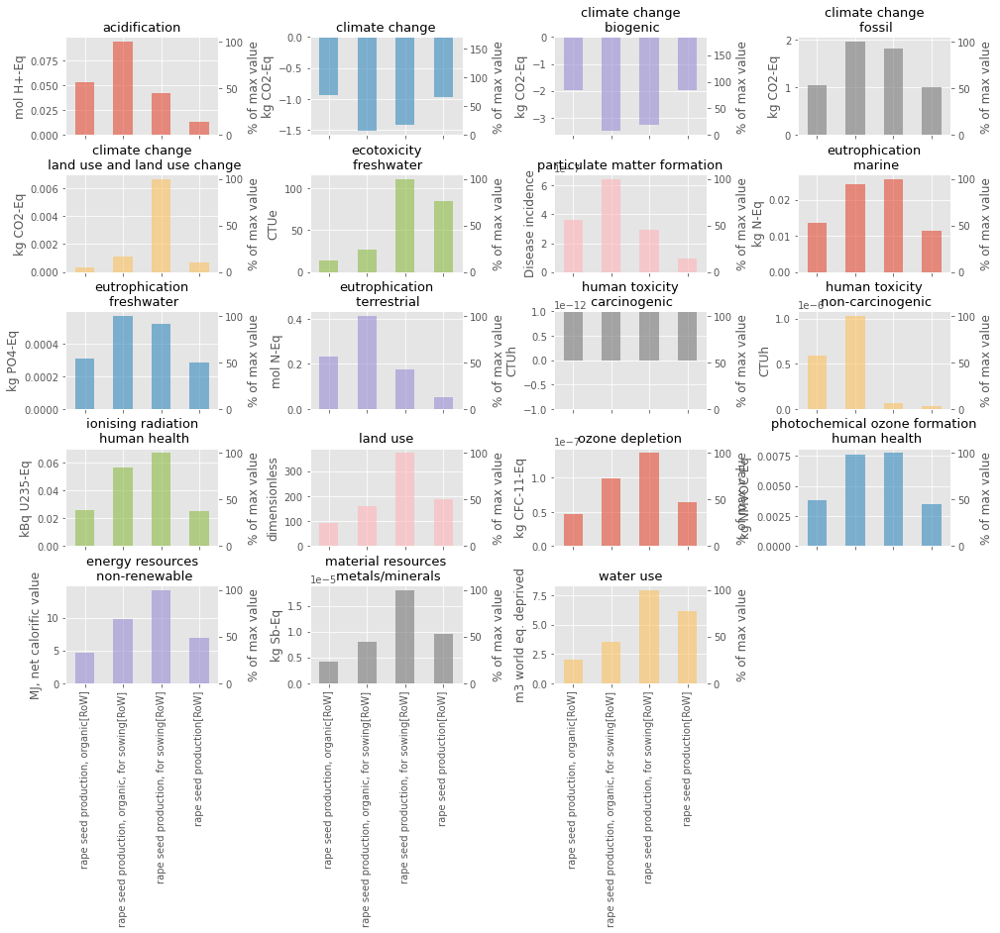

In [185]:
list_act.analyse(methods_CC = methods_CC, methods_EF = methods_EF, print_mode = 3)

In [1]:
1/0.000856

1168.2242990654206

Impact from both fertiliser and fertiliser operation

In [174]:
list_act = dbex.list_act(database = eidb,
                         name = 'ethanol production from sugar beet',
                         unit = 'kilogram',
                         location = 'RoW')

list_act.explore(strict = False, 
                 comments = True)

['ethanol production from sugar beet' (kilogram, RoW, None),
 'ethanol production from sugar beet molasses' (kilogram, RoW, None),
 'ethanol production from sugar beet' (kilogram, RoW, None)]


List of names:


{'ethanol production from sugar beet',
 'ethanol production from sugar beet molasses'}

List of locations:


{'RoW'}

List of units:


{'kilogram'}

'ethanol production from sugar beet' (kilogram, RoW, None)


'[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports of version 2, which are still available via the ecoinvent website. The change report linked above covers all central changes that were made during the conversion process.]\nThe multioutput-process "sugar beets, to fermentati



'ethanol production from sugar beet molasses' (kilogram, RoW, None)


"[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports of version 2, which are still available via the ecoinvent website. The change report linked above covers all central changes that were made during the conversion process.]\nInventory refers to the production of 1 kg hydrated



'ethanol production from sugar beet' (kilogram, RoW, None)


'[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports of version 2, which are still available via the ecoinvent website. The change report linked above covers all central changes that were made during the conversion process.]\nThe multioutput-process "sugar beets, to fermentati

ethanol production from sugar beet[RoW] (1.000000 kilogram)  \
                                                                                                        input   
Carbon dioxide, in air                                                                           NaN            
Carbon dioxide, non-fossil                                                Carbon dioxide, non-fossil            
Water                                                                                          Water            
Water#1                                                                                        Water            
Water, cooling, unspecified natural origin                Water, cooling, unspecified natural origin            
...                                                                                              ...            
tap water#6                                                                 market for tap water[ZA]            
tap water#7                                                                market for tap water[RoW]            
vinasse, from fermentation of sugar beet           vinasse, from fermentation of sugar beet, Recy...            
vinasse, from fermentation of sugar beet molasses                                                NaN            
wastewater, from residence                                                                       NaN            

                                                                          \
                                                     amount         unit   
Carbon dioxide, in air                                  NaN          NaN   
Carbon dioxide, non-fossil                              CO2     kilogram   
Water                                                   H2O  cubic meter   
Water#1                                                 H2O  cubic meter   
Water, cooling, unspecified natural origin              H2O  cubic meter   
...                                                     ...          ...   
tap water#6                                        0.000883     kilogram   
tap water#7                                        0.136589     kilogram   
vinasse, from fermentation of sugar beet          -1.655669     kilogram   
vinasse, from fermentation of sugar beet molasses       NaN          NaN   
wastewater, from residence                              NaN          NaN   

                                                  ethanol production from sugar beet molasses[RoW] (1.000000 kilogram)  \
                                                                                                                 input   
Carbon dioxide, in air                                                        Carbon dioxide, in air                     
Carbon dioxide, non-fossil                                                Carbon dioxide, non-fossil                     
Water                                                                                          Water                     
Water#1                                                                                          NaN                     
Water, cooling, unspecified natural origin                                                       NaN                     
...                                                                                              ...                     
tap water#6                                                                 market for tap water[ZA]                     
tap water#7                                                                market for tap water[RoW]                     
vinasse, from fermentation of sugar beet                                                         NaN                     
vinasse, from fermentation of sugar beet molasses  vinasse, from fermentation of sugar beet molas...                     
wastewater, from residence                                market for wastewater, from residence[RoW]                     

    

All flows:


,ethanol production from sugar beet_RoW,ethanol production from sugar beet molasses_RoW,ethanol production from sugar beet_RoW
market for ethanol fermentation plant,0.0,0.0,0.0
ethanol production from sugar beet,1.0,NaN,1.0
market for sodium phosphate,0.001598,NaN,0.003892
market for sulfuric acid,0.007993,0.037741,0.019473
"market for sodium sulfate, anhydrite",0.001065,NaN,0.002595
market for sugar beet,2.671425,NaN,6.507831
"vinasse, from fermentation of sugar beet, Recycled Content cut-off",-1.655669,NaN,-4.033359
"market for heat, district or industrial, natural gas",0.879727,12.654276,2.143094
market for tap water,0.25464,8.051276,0.620326
"market for electricity, medium voltage",0.002809,0.013219,0.006842


Carbon footprint:


,climate change\nglobal warming potential (GWP100),climate change: biogenic\nglobal warming potential (GWP100),climate change: fossil\nglobal warming potential (GWP100),climate change: land use and land use change\nglobal warming potential (GWP100)
ethanol production from sugar beet[RoW],-0.404344,-0.676564,0.271974,0.000246
ethanol production from sugar beet molasses[RoW],1.319291,0.308665,1.009903,0.000723
ethanol production from sugar beet[RoW]',-0.985019,-1.648171,0.662554,0.000599


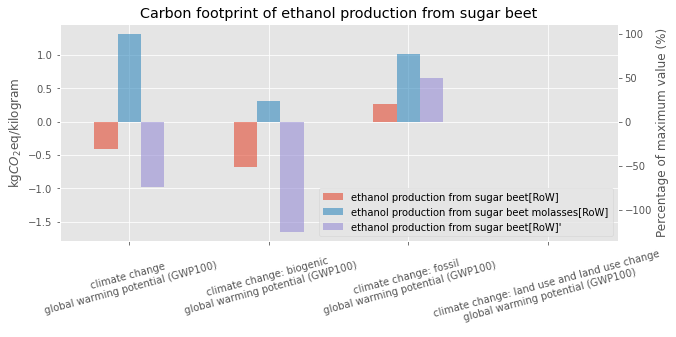

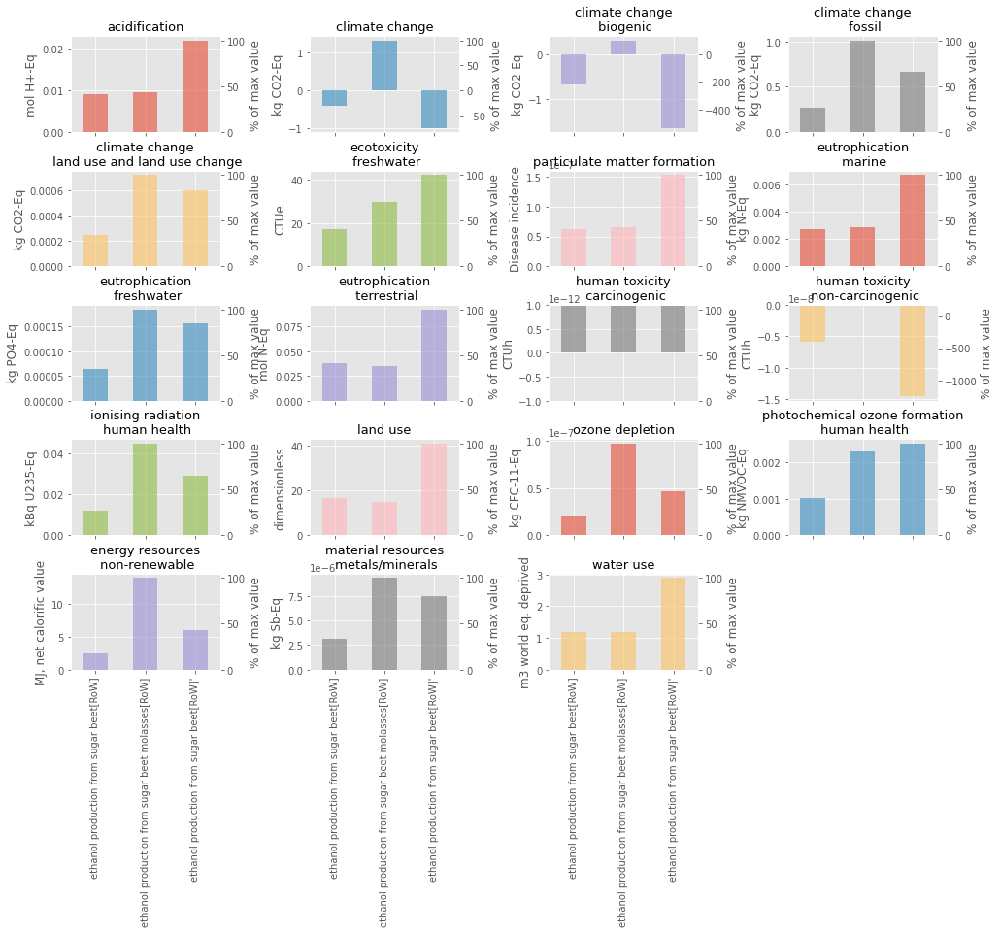

In [175]:
list_act.analyse(methods_CC, methods_EF, print_mode = 2)

# Calculation

In [14]:
act = [act for act in eidb if 'market for NPK (15-15-15) fertiliser' in act['name']
 and 'RoW' in act['location']][0]
act

'market for NPK (15-15-15) fertiliser' (kilogram, RoW, None)

In [17]:
act = [act for act in eidb if 'NPK (15-15-15) fertiliser production' in act['name']
        and 'RoW' in act['location']][0]
act

'NPK (15-15-15) fertiliser production' (kilogram, RoW, None)

In [18]:
agb.printAct(act)

Error while parsing formula 'F-' : backing to amount


NPK (15-15-15) fertiliser production[RoW] (1.000000 kilogram)  \
                                                                                           input   
Ammonia                                                                       Ammonia              
Fluoride                                                                     Fluoride              
Fluorine                                                                     Fluorine              
Nitrogen                                                                     Nitrogen              
Particulates, > 2.5 um, and < 10um                 Particulates, > 2.5 um, and < 10um              
Phosphorus                                                                 Phosphorus              
Water                                                                           Water              
ammonium nitrate                                     market for ammonium nitrate[RoW]              
dolomite                                                     market for dolomite[RoW]              
electricity, low voltage                      market for electricity, low voltage[AU]              
electricity, low voltage#1                    market for electricity, low voltage[NZ]              
electricity, low voltage#2             market group for electricity, low voltage[RAF]              
electricity, low voltage#3             market group for electricity, low voltage[RLA]              
monoammonium phosphate                         market for monoammonium phosphate[RoW]              
potassium chloride                                 market for potassium chloride[RoW]              
steam, in chemical industry               market for steam, in chemical industry[RoW]              

                                                             
                                      amount           unit  
Ammonia                                  H3N       kilogram  
Fluoride                            0.000135       kilogram  
Fluorine                                  F2       kilogram  
Nitrogen                                  N2       kilogram  
Particulates, > 2.5 um, and < 10um   0.00015       kilogram  
Phosphorus                                 P       kilogram  
Water                                    H2O    cubic meter  
ammonium nitrate                       0.359       kilogram  
dolomite                               0.103       kilogram  
electricity, low voltage            0.002438  kilowatt hour  
electricity, low voltage#1          0.000444  kilowatt hour  
electricity, low voltage#2          0.007146  kilowatt hour  
electricity, low voltage#3           0.01775  kilowatt hour  
monoammonium phosphate                 0.288       kilogram  
potassium chloride                      0.25       kilogram  
steam, in chemical industry         0.109091       kilogram

In [23]:
methods_CED = [ m for m in bw.methods if 'cumulative energy demand' in str(m)]

In [28]:
bw.Method(methods_CED[0]).metadata

{'description': 'Characterisation with the upper heating value of the fossil energy resources extracted.',
 'filename': 'LCIA_Implementation_3.8.xlsx',
 'unit': 'MJ-Eq',
 'abbreviation': 'cumulative-energy-demandfn.87dea213a7ae4b1434d554f6c25cf4d0',
 'num_cfs': 6}

In [24]:
agb.multiLCA(act, methods_CED)

,"fossil - non-renewable energy resources, fossil","nuclear - non-renewable energy resources, nuclear","biomass - renewable energy resources, biomass","water - renewable energy resources, potential (in barrage water), converted","geothermal - renewable energy resources, geothermal, converted","solar - renewable energy resources, solar, converted","wind - renewable energy resources, kinetic (in wind), converted","primary forest - non-renewable energy resources, primary forest"
NPK (15-15-15) fertiliser production[RoW],14.004163,0.380418,0.281205,0.409759,0.01222,0.009649,0.066949,0.00368


# Biogas

In [6]:
list_act = dbex.list_act(database = eidb,
                         name = 'biogas')
list_act.explore(strict = False, comments = False)

List of names:


{'biogas production from grass',
 'biogas purification to biomethane by amino washing',
 'biogas purification to biomethane by membrane technique',
 'biogas purification to biomethane by pressure swing adsorption',
 'heat and power co-generation, biogas, gas engine',
 'heat and power co-generation, biogas, gas engine, renewable energy products',
 'market for biogas',
 'market for biogas, from grass'}

List of locations:


{'AT',
 'AU',
 'BE',
 'BG',
 'CA-AB',
 'CA-NB',
 'CA-NS',
 'CA-ON',
 'CA-PE',
 'CA-QC',
 'CH',
 'CL',
 'CY',
 'CZ',
 'DE',
 'DK',
 'EE',
 'ES',
 'FI',
 'FR',
 'GB',
 'GR',
 'HR',
 'HU',
 'ID',
 'IE',
 'IR',
 'IT',
 'KR',
 'LT',
 'LU',
 'LV',
 'MX',
 'MY',
 'NL',
 'NO',
 'PE',
 'PL',
 'PT',
 'RO',
 'RS',
 'RoW',
 'SE',
 'SI',
 'SK',
 'TH',
 'TR',
 'TW',
 'US-HICC',
 'US-MRO',
 'US-NPCC',
 'US-RFC',
 'US-SERC',
 'US-TRE',
 'US-WECC'}

List of units:


{'cubic meter', 'kilogram', 'kilowatt hour', 'megajoule'}

## Market for biogas

In [7]:
list_act = dbex.list_act(database = eidb,
                         name = 'market for biogas')
list_act.explore(strict = False, comments = True)

['market for biogas, from grass' (cubic meter, CH, None),
 'market for biogas' (cubic meter, CH, None),
 'market for biogas' (cubic meter, RoW, None)]

List of names:


{'market for biogas', 'market for biogas, from grass'}

List of locations:


{'CH', 'RoW'}

List of units:


{'cubic meter'}

'market for biogas, from grass' (cubic meter, CH, None)


"biogas, from grass' is a non-fossil fuel with a calorific value of 29.094 MJ/m3. It is used as a gaseous fuel and is sourced from a grass bio-refinery.  Its main applications are in the following sectors: industrial and district power source. \nThis regional market activity for CH is considered motivated by the lack of biogas imports to Switzerland accoding to the Swiss national energy statistics for 2016 (in tab. 18). (SFOE 2017. Schweizerische Gesamtenergiestatistik 2016. Swiss Federal Office of Energy, SFOE. Bern, Switzerland)\nThis is a market activity. Each market represents the consumption mix of a product in a given geography, connecting suppliers with consumers of the same product in the same geographical area. Markets group the producers and also the imports of the product (if relevant) within the same geographical area. They also account for transport to the consumer and for the losses during that process, when relevant.\nThis market contains no transport or losses, as they 



'market for biogas' (cubic meter, CH, None)


"This regional market activity for CH is considered motivated by the lack of biogas imports to Switzerland accoding to the Swiss national energy statistics for 2016 (in tab. 18). (SFOE 2017. Schweizerische Gesamtenergiestatistik 2016. Swiss Federal Office of Energy, SFOE. Bern, Switzerland)\nbiogas' is a non-fossil fuel with a net calorific value of 22.73 MJ/m3. It is used as a gaseous fuel and is sourced from anaerobic digestion of manure.  Its main applications are in the following sectors: industrial and district power source. \nThis is a market activity, representing a treatment mix. In the case of products needing treatment, market mixes are supplied by the activities treating the product in the geography defined by the market, and they supply the activities needing to treat the product, as they have generated it as a by-product in the Undefined processes (present as a negative input in system models). Transport to the treating facility or losses are also accounted in this type of



'market for biogas' (cubic meter, RoW, None)


"biogas' is a non-fossil fuel with a net calorific value of 22.73 MJ/m3. It is used as a gaseous fuel and is sourced from anaerobic digestion of manure.  Its main applications are in the following sectors: industrial and district power source. \nThis is a market activity, representing a treatment mix. In the case of products needing treatment, market mixes are supplied by the activities treating the product in the geography defined by the market, and they supply the activities needing to treat the product, as they have generated it as a by-product in the Undefined processes (present as a negative input in system models). Transport to the treating facility or losses are also accounted in this type of markets, when relevant.\nThis is the market for  'biogas', in the Global geography.\nTransport from producers to consumers of this product in the geography covered by the market is included."

market for biogas, from grass[CH] (1.000000 cubic meter)  \
                                                                      input   
biogas                                                            NaN         
biogas#1                                                          NaN         
biogas#2                                                          NaN         
biogas#3                                                          NaN         
biogas, from grass                   biogas production from grass[CH]         

                                        \
                   amount         unit   
biogas                NaN          NaN   
biogas#1              NaN          NaN   
biogas#2              NaN          NaN   
biogas#3              NaN          NaN   
biogas, from grass    1.0  cubic meter   

                         market for biogas[CH] (1.000000 cubic meter)  \
                                                                input   
biogas                              anaerobic digestion of manure[CH]   
biogas#1            treatment of used vegetable cooking oil by ana...   
biogas#2             treatment of biowaste by anaerobic digestion[CH]   
biogas#3            treatment of sewage sludge by anaerobic digest...   
biogas, from grass                                                NaN   

                                           \
                      amount         unit   
biogas              0.505966  cubic meter   
biogas#1            0.004895  cubic meter   
biogas#2            0.256066  cubic meter   
biogas#3            0.233073  cubic meter   
biogas, from grass       NaN          NaN   

                        market for biogas[RoW] (1.000000 cubic meter)  \
                                                                input   
biogas                             anaerobic digestion of manure[RoW]   
biogas#1            treatment of used vegetable cooking oil by ana...   
biogas#2            treatment of biowaste by anaerobic digestion[RoW]   
biogas#3            treatment of sewage sludge by anaerobic digest...   
biogas, from grass                                                NaN   

                                           
                      amount         unit  
biogas              0.505836  cubic meter  
biogas#1            0.004896  cubic meter  
biogas#2            0.256133  cubic meter  
biogas#3            0.233135  cubic meter  
biogas, from grass       NaN          NaN

All flows:


,"market for biogas, from grass_CH",market for biogas_CH,market for biogas_RoW
"market for biogas, from grass",1.0,NaN,NaN
biogas production from grass,1.0,NaN,NaN
market for biogas,NaN,1.0,1.0
anaerobic digestion of manure,NaN,0.505966,0.505836
treatment of used vegetable cooking oil by anaerobic digestion,NaN,0.004895,0.004896
treatment of biowaste by anaerobic digestion,NaN,0.256066,0.256133
treatment of sewage sludge by anaerobic digestion,NaN,0.233073,0.233135


Technosphere flows:


,"market for biogas, from grass_CH",market for biogas_CH,market for biogas_RoW
biogas production from grass,1.0,NaN,NaN
anaerobic digestion of manure,NaN,0.505966,0.505836
treatment of used vegetable cooking oil by anaerobic digestion,NaN,0.004895,0.004896
treatment of biowaste by anaerobic digestion,NaN,0.256066,0.256133
treatment of sewage sludge by anaerobic digestion,NaN,0.233073,0.233135


Biosphere flows:


,"market for biogas, from grass_CH",market for biogas_CH,market for biogas_RoW


Carbon footprint:


,climate change\nglobal warming potential (GWP100),climate change: biogenic\nglobal warming potential (GWP100),climate change: fossil\nglobal warming potential (GWP100),climate change: land use and land use change\nglobal warming potential (GWP100)
"market for biogas, from grass[CH]",-0.327138,-0.512888,0.185716,0.000033
market for biogas[CH],0.557173,0.410567,0.146445,0.000161
market for biogas[RoW],0.772472,0.398069,0.374191,0.000211


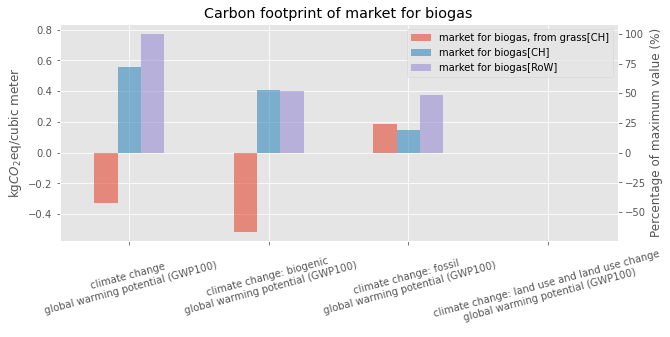

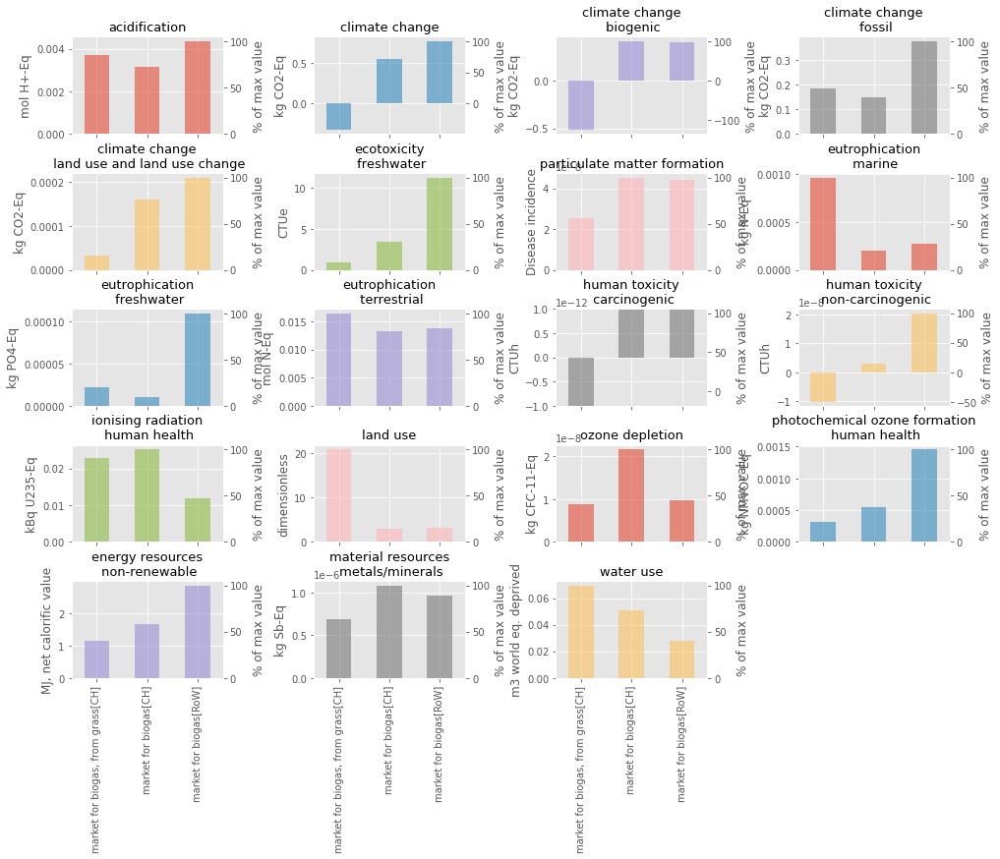

In [8]:
list_act.analyse(methods_CC, methods_EF, print_mode = 3)

'market for biogas, from grass' (cubic meter, CH, None)
('EF v3.0 EN15804', 'climate change', 'global warming potential (GWP100)')
('EF v3.0 EN15804', 'climate change: biogenic', 'global warming potential (GWP100)')
('EF v3.0 EN15804', 'climate change: fossil', 'global warming potential (GWP100)')
('EF v3.0 EN15804', 'climate change: land use and land use change', 'global warming potential (GWP100)')


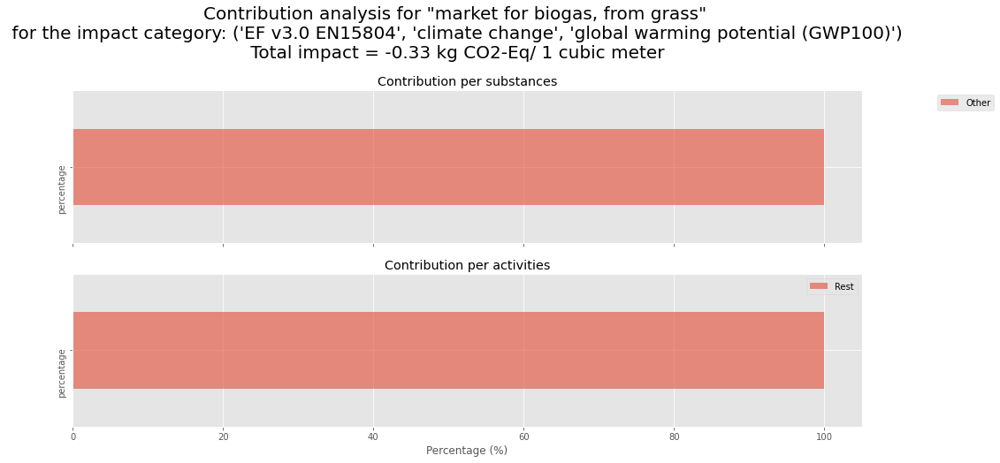

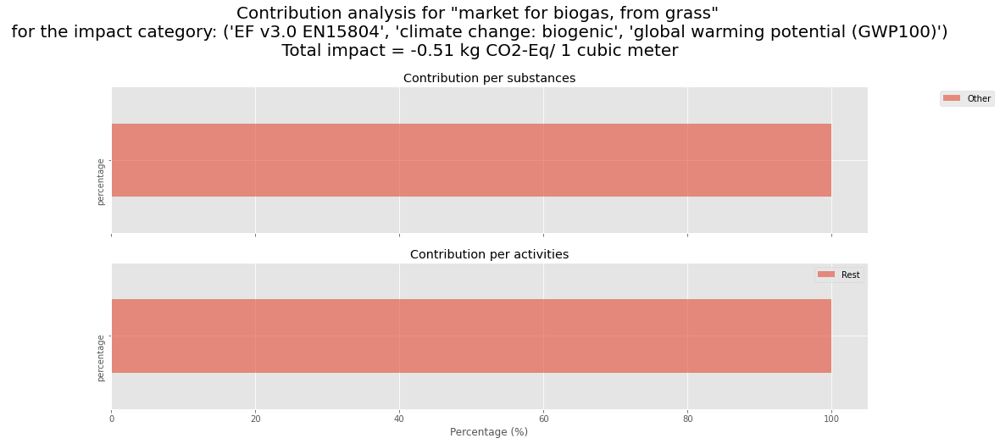

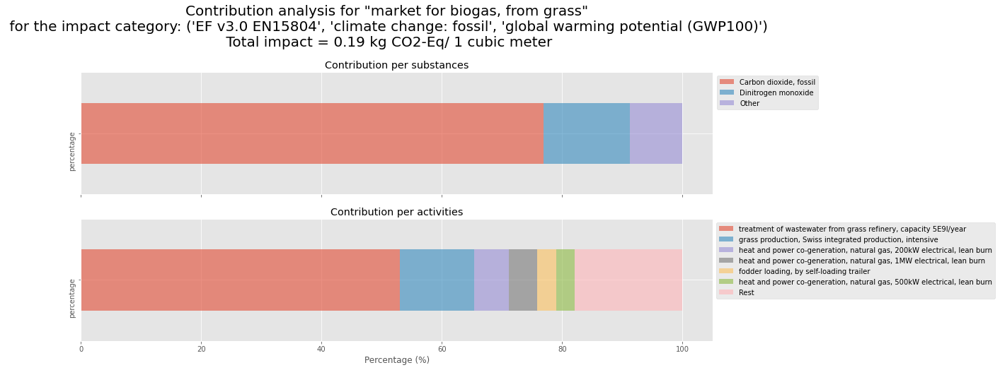

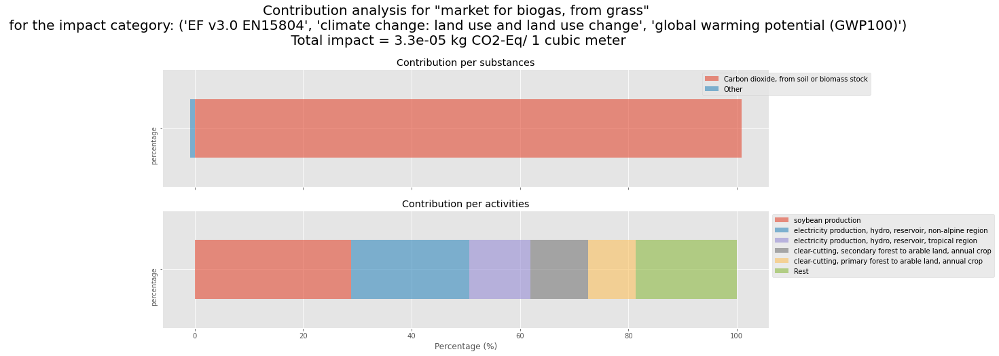

In [9]:
list_act.contribution_analysis(i = 0,
                               methods = methods_CC,
                               save = True) 

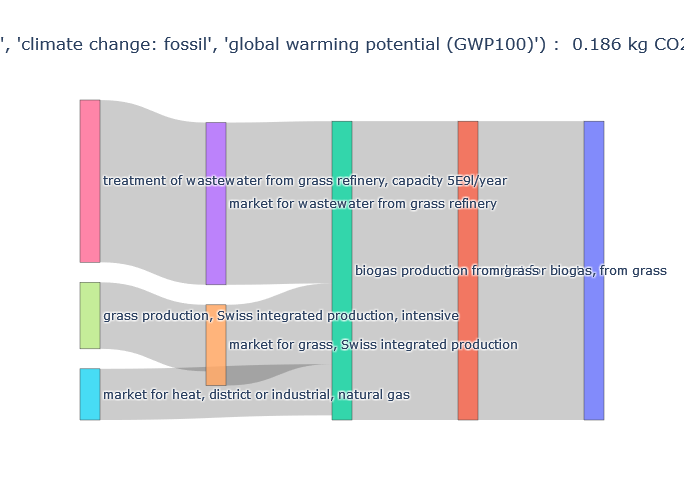

In [10]:
list_act.plot_sankey(i = 0, method = methods_CC[2], cutoff = 0.1)

('EF v3.0 EN15804', 'climate change', 'global warming potential (GWP100)')


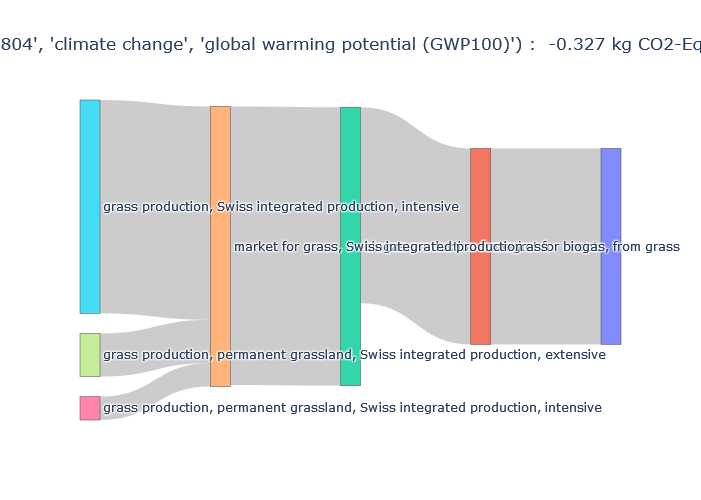

('EF v3.0 EN15804', 'climate change: biogenic', 'global warming potential (GWP100)')


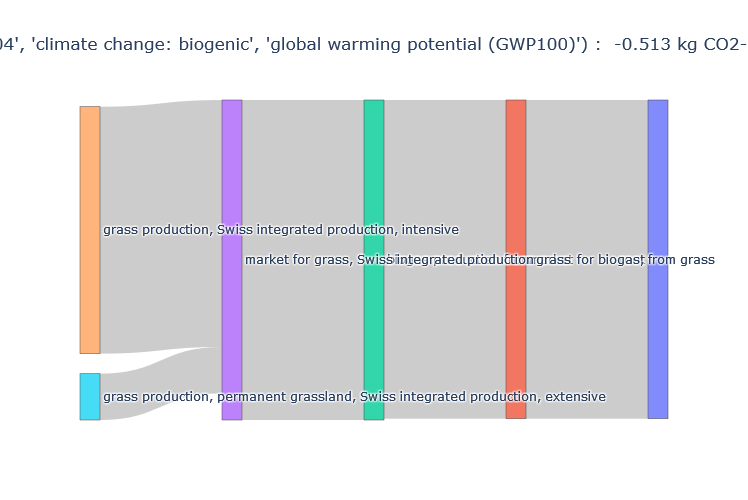

('EF v3.0 EN15804', 'climate change: fossil', 'global warming potential (GWP100)')


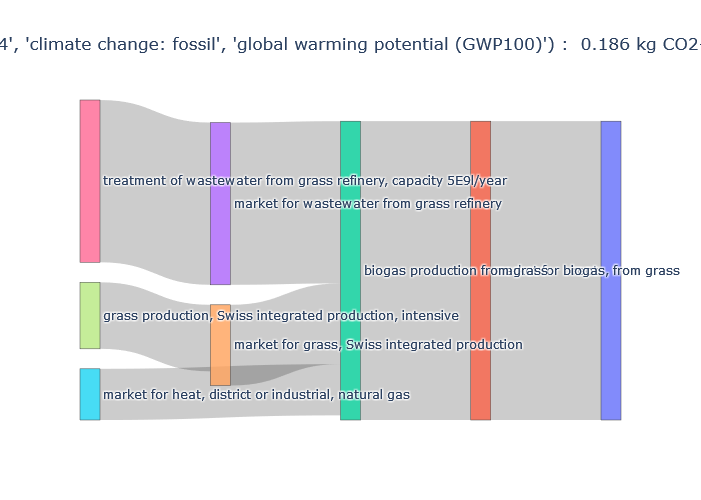

('EF v3.0 EN15804', 'climate change: land use and land use change', 'global warming potential (GWP100)')


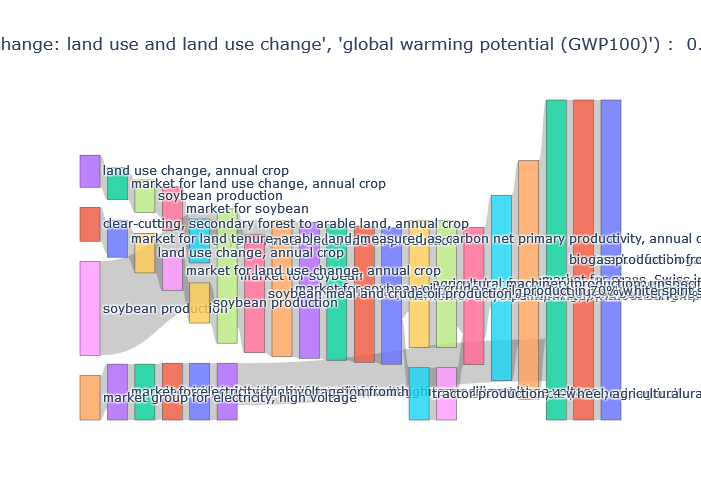

In [11]:
list_act.plot_sankeys(i = 0, methods = methods_CC, cutoff = 0.1, save = False)

In [118]:
list_act.plot_sunburst(i = 0, method = methods_CC[2], cutoff = 0.05)

,label,location,parent,value,value_pct
0,"market for biogas, from grass",CH,,0.185716,100.000000
1,biogas production from grass,CH,"market for biogas, from grass",0.185716,100.000000
2,market for wastewater from grass refinery,CH,biogas production from grass,0.100820,54.287074
3,"market for grass, Swiss integrated production",CH,biogas production from grass,0.050167,27.012625
4,"market for heat, district or industrial, natur...",CH,biogas production from grass,0.031834,17.141344
5,"treatment of wastewater from grass refinery, c...",CH,market for wastewater from grass refinery,0.100820,54.287074
6,"grass production, Swiss integrated production,...",CH,"market for grass, Swiss integrated production",0.041336,22.257795
7,"fodder loading, by self-loading trailer",CH,"grass production, Swiss integrated production,...",0.009345,5.031731
8,"heat and power co-generation, natural gas, 1MW...",CH,"market for heat, district or industrial, natur...",0.010963,5.903349
9,"heat and power co-generation, natural gas, 200...",CH,"market for heat, district or industrial, natur...",0.013705,7.379633


TypeError: sunburst() got an unexpected keyword argument 'valueformat'

,label,location,parent,value,value_pct
0,"market for biogas, from grass",CH,,-0.327138,100.000000
1,biogas production from grass,CH,"market for biogas, from grass",-0.327138,100.000000
2,market for wastewater from grass refinery,CH,biogas production from grass,0.101724,-31.095114
3,"market for grass, Swiss integrated production",CH,biogas production from grass,-0.464860,142.098971
4,"market for heat, district or industrial, natur...",CH,biogas production from grass,0.031841,-9.733237
5,"grass production, Swiss integrated production,...",CH,"market for grass, Swiss integrated production",-0.356148,108.867654
6,"grass production, permanent grassland, Swiss i...",CH,"market for grass, Swiss integrated production",-0.039087,11.948170
7,"grass production, permanent grassland, Swiss i...",CH,"market for grass, Swiss integrated production",-0.072092,22.037151
8,"treatment of wastewater from grass refinery, c...",CH,market for wastewater from grass refinery,0.101724,-31.095114
9,"heat and power co-generation, natural gas, 200...",CH,"market for heat, district or industrial, natur...",0.013708,-4.190358


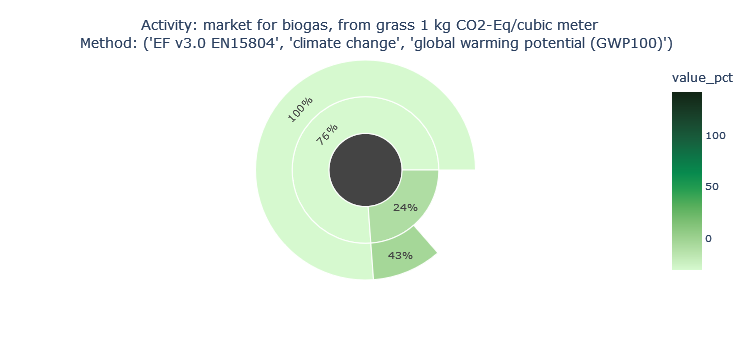

In [115]:
list_act.plot_sunburst(i = 0, method = methods_CC[0], cutoff = 0.04)

('EF v3.0 EN15804', 'climate change', 'global warming potential (GWP100)')


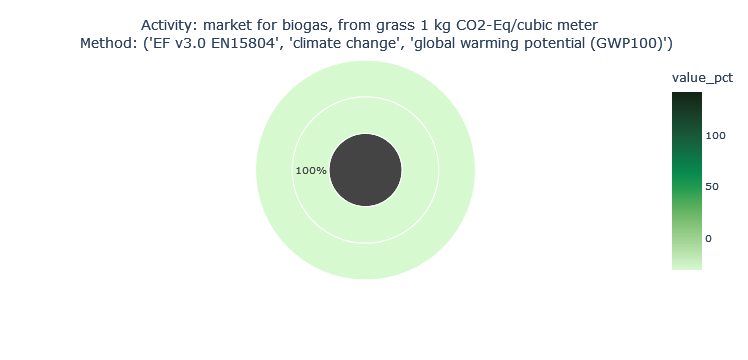

('EF v3.0 EN15804', 'climate change: biogenic', 'global warming potential (GWP100)')


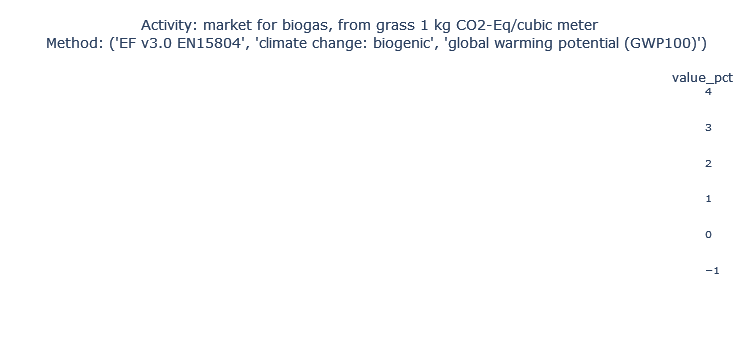

('EF v3.0 EN15804', 'climate change: fossil', 'global warming potential (GWP100)')


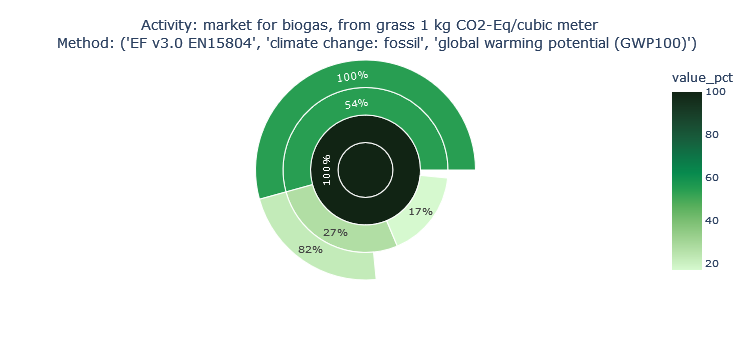

('EF v3.0 EN15804', 'climate change: land use and land use change', 'global warming potential (GWP100)')


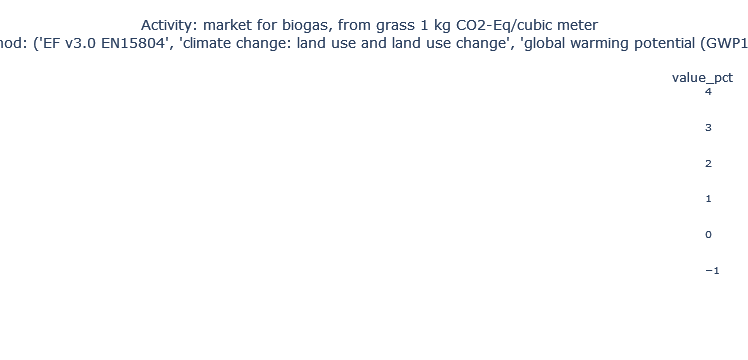

In [113]:
list_act.plot_sunbursts(i = 0, methods = methods_CC, cutoff = 0.1, save = False)

# Sunburst tries

In [47]:
from bw2calc import GraphTraversal
import plotly.express as px

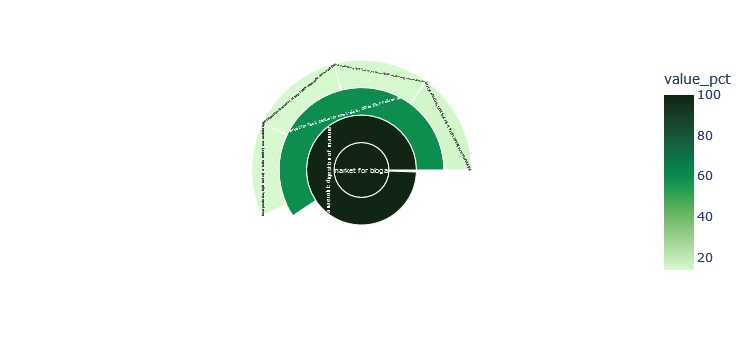

In [102]:
method = methods_CC[2]
i = 1
cutoff = 0.08
act = list_act.list_act[i]
lca = bw.LCA({act:amount}, method)
lca.lci()
lca.lcia() 
impact = lca.score
unit = bw.Method(method).metadata['unit']

gt = GraphTraversal().calculate({act:amount}, 
                                method = method, 
                                cutoff=cutoff)

#Label 
acts = gt["lca"].activity_dict
id_to_key = {v:k for k, v in acts.items()}

ids = list(gt["nodes"].keys())
#print(ids)
labels = [bw.get_activity(id_to_key[id])["name"] for id in ids[1:]]
labels_loc = [bw.get_activity(id_to_key[id])["location"] for id in ids[1:]]
labels = ["root"] + labels
labels_loc = [act['location']] + labels_loc
#print(labels)

#Source
edges = gt["edges"]
ids_source = [edge["to"] for edge in edges]
ids_source = [bw.get_activity(id_to_key[id])["name"] for id in ids_source[1:]]
ids_source = [''] + ids_source
#print(ids_source)

#Value
value = [edge["impact"] for edge in edges]
value_pct = [edge["impact"]/impact * 100 for edge in edges]
#print(value)

data = dict(label = labels[1:],
            location = labels_loc[1:],
            parent = ids_source,
            value = value,
            value_pct = value_pct)
#display(data)

fig = px.sunburst(
    data,
    names='label',
    parents='parent',
    values='value',
    branchvalues="total",
    color='value_pct',
    color_continuous_scale='algae',
    hover_data=['location'],
)
fig

In [93]:
print(len(data['label']))
print(len(data['location']))
print(len(data['parent']))
print(len(data['value']))

9
9
12
12


In [103]:
for i, label in enumerate(data['label']):
    print(label + ': %0.2f'%data['value_pct'][i])

market for biogas: 100.00
anaerobic digestion of manure: 99.42
market for heat, central or small-scale, other than natural gas: 59.36
heat production, light fuel oil, at boiler 10kW condensing, non-modulating: 14.06
heat production, light fuel oil, at boiler 10kW, non-modulating: 14.96
heat production, light fuel oil, at boiler 100kW, non-modulating: 13.87
heat production, light fuel oil, at boiler 100kW condensing, non-modulating: 13.96


In [101]:
for i, label in enumerate(data['label']):
    print(label + ': %0.2f'%data['value_pct'][i])

market for biogas: 100.00
anaerobic digestion of manure: 99.42
anaerobic digestion plant construction, agriculture, with methane recovery: 7.20
market for heat, central or small-scale, other than natural gas: 59.36
heat production, light fuel oil, at boiler 10kW condensing, non-modulating: 14.06
heat production, light fuel oil, at boiler 10kW, non-modulating: 14.96
heat production, light fuel oil, at boiler 100kW, non-modulating: 13.87
heat production, light fuel oil, at boiler 100kW condensing, non-modulating: 13.96
market for light fuel oil: 1.90


In [96]:
data['value_pct']

[99.99999999999997,
 99.42029582256338,
 7.197800416924826,
 59.356725321976846,
 14.062155073621483,
 14.957426996474817,
 13.868466862675739,
 13.960103600423121,
 1.8980882769324419,
 1.7842029689643621,
 1.7842029689643621,
 1.7733018775516913]

In [79]:
#pd.DataFrame.from_dict(data)

In [62]:
amount = 1
method = methods_CC[2]
cutoff = 0.1
i = 0
act = list_act.list_act[i]
lca = bw.LCA({act:amount}, method)
lca.lci()
lca.lcia() 
impact = lca.score
unit = bw.Method(method).metadata['unit']

gt = GraphTraversal().calculate({act:amount}, 
                                method = method, 
                                cutoff=cutoff)

In [63]:
len(data['label'])

39

In [77]:
print(len(data['label']))
print(len(data['location']))
print(len(data['parent']))
print(len(data['value']))

7
7
7
7


In [65]:
len(data['parent'])

44

In [66]:
len(data['value'])

44

In [67]:
len(data['value_pct'])

44

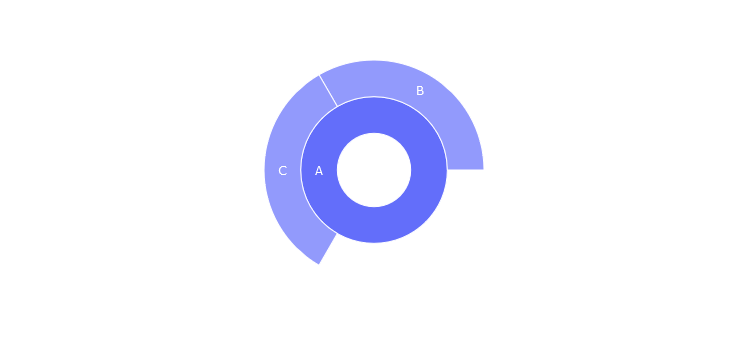

In [62]:
import plotly.express as px
data = dict(
    character=["A", "B", "C"],
    parent=[" ", "A", "A"],
    value = [1, 1, 1])

fig = px.sunburst(
    data,
    names='character',
    parents='parent',
    values='value',
)
fig.show()

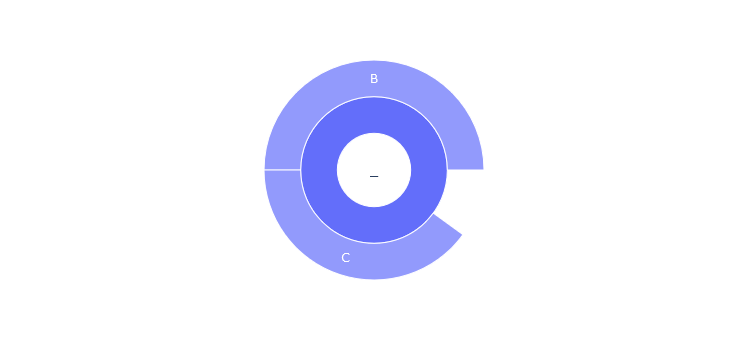

In [76]:
import plotly.express as px
data = dict(
    character=["A", "B", "C", ],
    parent=["_", "A", "A",],
    value= [100, 50, 40])

fig = px.sunburst(
    data,
    names='character',
    parents='parent',
    values='value',
    branchvalues="total",
)
fig.show()

In [72]:
5/16 * 360

112.5

In [24]:
df = pd.DataFrame.from_dict(data)
df

,character,parent,value
0,A,,360
1,B,A,60
2,C,A,40
3,D,A,10


In [ ]:
df_data = pd.DataFrame.from_dict(data)
df_data

fig = px.sunburst(df_data,
                  
    names='character',
    parents='parent',
    values='value',
)
fig.show()

In [27]:
df = px.data.tips()
df.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


C:\Users\romai\anaconda3\envs\python38\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\romai\anaconda3\envs\python38\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\romai\anaconda3\envs\python38\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



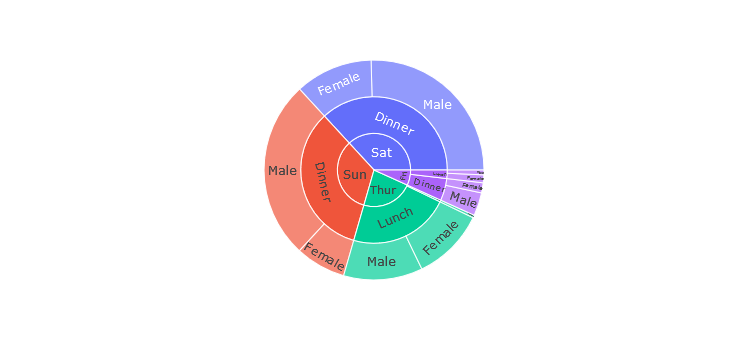

In [23]:
import plotly.express as px
df = px.data.tips()
fig = px.sunburst(df, path=['day', 'time', 'sex'], values='total_bill')
fig.show()

In [67]:
import plotly.express as px

In [69]:
act = list_act.list_act[0]
amount = 1
method = methods_CC[0]
cutoff = 0.1

In [70]:
lca = bw.LCA({act:amount}, method)
lca.lci()
lca.lcia() 
impact = lca.score
unit = bw.Method(method).metadata['unit']

In [71]:
from bw2calc import GraphTraversal
gt = GraphTraversal().calculate({act:amount}, 
                                method = method, 
                                cutoff=cutoff)

In [72]:
acts = gt["lca"].activity_dict
#print(acts)
id_to_key = {v:k for k, v in acts.items()}
#print(id_to_key)
#labels = {k: bw.get_activity(v)["name"] for k in gt["nodes"].values()}
ids = list(gt["nodes"].keys())
print(ids)
labels = [bw.get_activity(id_to_key[id])["name"] for id in ids[1:]]
labels = ["root"] + labels
id_to_idx = {id : idx for idx, id in enumerate(ids)}
edges = gt["edges"]
edges_plot = dict(
    target = [id_to_idx[edge["to"]] for edge in edges],
    source = [id_to_idx[edge["from"]] for edge in edges],
    value = [edge["impact"]/impact * 100 for edge in edges])

[-1, 14208, 8275, 11777]


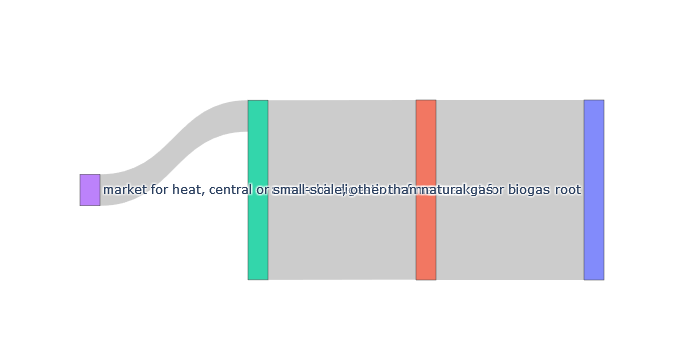

In [73]:
import plotly.graph_objects as go

fig = go.Figure(data = [go.Sankey(valueformat = '.0f',
                            valuesuffix = ' %',
                            node = dict(label=labels),
                            link = edges_plot,
                            #domain = {'y': [(n-i-1)/n, (n-i)/n]}
                                 ),
                       ],
               )
fig

# Test

In [78]:
acts = gt["lca"].activity_dict
id_to_key = {v:k for k, v in acts.items()}

ids = list(gt["nodes"].keys())
print(ids)
labels = [bw.get_activity(id_to_key[id])["name"] for id in ids[1:]]
labels = ["root"] + labels
id_to_idx = {id : idx for idx, id in enumerate(ids)}
edges = gt["edges"]
edges_plot = dict(
    target = [id_to_idx[edge["to"]] for edge in edges],
    source = [id_to_idx[edge["from"]] for edge in edges],
    value = [edge["impact"]/impact * 100 for edge in edges])

[-1, 14208, 8275, 11777]


In [86]:
id_to_idx

{-1: 0, 14208: 1, 8275: 2, 11777: 3}

In [87]:
ids_source = [edge["from"] for edge in edges]
ids_source = [bw.get_activity(id_to_key[id])["name"] for id in ids[1:]]
ids_source

['market for biogas',
 'anaerobic digestion of manure',
 'market for heat, central or small-scale, other than natural gas']

In [82]:
id_to_key

{0: ('ecoinvent 3.8 cut-off', '2f777ef07634d59ddcccccfac363558c'),
 1: ('ecoinvent 3.8 cut-off', '305a8a16b111f2aeb9267184ccad9e5f'),
 2: ('ecoinvent 3.8 cut-off', 'a00a365515154b0cdac9ea310d27cb11'),
 3: ('ecoinvent 3.8 cut-off', 'a8fe325e38e7f01a672a76ba1399a32a'),
 4: ('ecoinvent 3.8 cut-off', 'c665a8d30b08ab7f59409abb406716c5'),
 5: ('ecoinvent 3.8 cut-off', 'c438c27e8b9d2883da72832366609688'),
 6: ('ecoinvent 3.8 cut-off', '03a9cf0d72660faedf23a61d83258793'),
 7: ('ecoinvent 3.8 cut-off', '7dd8aaa3c8db9b6877c47da68a6f293f'),
 8: ('ecoinvent 3.8 cut-off', '8bde63e60d7a8849a4be292609d84d7a'),
 9: ('ecoinvent 3.8 cut-off', '7073c6037080d4e43a736f93849f8932'),
 10: ('ecoinvent 3.8 cut-off', '111fa49a6e0ae219f0a05e09928a5a90'),
 11: ('ecoinvent 3.8 cut-off', '545038180d1f6e580f79fd3b60a06d88'),
 12: ('ecoinvent 3.8 cut-off', 'a9d42da6abae818928b9aee596f173af'),
 13: ('ecoinvent 3.8 cut-off', '321cafc761c82fff492f3036d69faa72'),
 14: ('ecoinvent 3.8 cut-off', 'b133746a5d07f9f55d83c490fd

In [79]:
edges_plot

{'target': [0, 1, 2],
 'source': [1, 2, 3],
 'value': [100.00000000000003, 99.81294402700186, 17.49308393844502]}

In [108]:
#Label 
acts = gt["lca"].activity_dict
id_to_key = {v:k for k, v in acts.items()}

ids = list(gt["nodes"].keys())
print(ids)
labels = [bw.get_activity(id_to_key[id])["name"] for id in ids[1:]]
labels = ["root"] + labels
print(labels)

#Source
edges = gt["edges"]
ids_source = [edge["to"] for edge in edges]
ids_source = [bw.get_activity(id_to_key[id])["name"] for id in ids_source[1:]]
ids_source = [''] + ids_source
print(ids_source)

#Value
value = [edge["impact"]/impact * 100 for edge in edges]
print(value)

data = dict(label = labels[1:],
            parent = ids_source,
            value = value)
display(data)

fig = px.sunburst(
    data,
    names='label',
    parents='parent',
    values='value',
)

fig.show()

[-1, 14208, 8275, 11777]
['root', 'market for biogas', 'anaerobic digestion of manure', 'market for heat, central or small-scale, other than natural gas']
['', 'market for biogas', 'anaerobic digestion of manure']
[100.00000000000003, 99.81294402700186, 17.49308393844502]


{'label': ['market for biogas',
  'anaerobic digestion of manure',
  'market for heat, central or small-scale, other than natural gas'],
 'parent': ['', 'market for biogas', 'anaerobic digestion of manure'],
 'value': [100.00000000000003, 99.81294402700186, 17.49308393844502]}

In [104]:
ids_source = [edge["from"] for edge in edges]
ids_source = [bw.get_activity(id_to_key[id])["name"] for id in ids_source]
print(ids_source)

['market for biogas', 'anaerobic digestion of manure', 'market for heat, central or small-scale, other than natural gas']


In [100]:
ids_source = [edge["to"] for edge in edges]
ids_source = [bw.get_activity(id_to_key[id])["name"] for id in ids[1:]]
print(ids_source)

['market for biogas', 'anaerobic digestion of manure', 'market for heat, central or small-scale, other than natural gas']


In [80]:
#Label 
acts = gt["lca"].activity_dict
id_to_key = {v:k for k, v in acts.items()}

ids = list(gt["nodes"].keys())
print(ids)
labels = [bw.get_activity(id_to_key[id])["name"] for id in ids[1:]]
labels = ["root"] + labels
print(label)

data = dict(label = labels[1:],
            parent = sources,
            value = [edge["impact"]/impact * 100 for edge in edges])

fig = px.sunburst(
    data,
    names='label',
    parents='parent',
    values='value',
)

fig.show()

ValueError: Value of 'names' is not the name of a column in 'data_frame'. Expected one of ['target', 'source', 'value'] but received: label

In [75]:
fig = px.sunburst(
    data,
    names='label',
    parents='parent',
    values='value',
)

fig.show()

## Biogass from grass

In [54]:
list_act = dbex.list_act(database = eidb,
                         name = 'biogas production from grass')
list_act.search_and_lists()

List of names:


{'biogas production from grass'}

List of locations:


{'CH'}

List of units:


{'cubic meter', 'kilogram'}

['biogas production from grass' (kilogram, CH, None),
 'biogas production from grass' (cubic meter, CH, None),
 'biogas production from grass' (kilogram, CH, None)]

List of names:


{'biogas production from grass'}

List of locations:


{'CH'}

List of units:


{'cubic meter', 'kilogram'}

'biogas production from grass' (kilogram, CH, None)
The dataset represents a multioutput process and describes a bio-refinery (grass-refinery) that delivers three co-products: biogas, proteins and fibres. Grass input is assumed to have a carbon content of 45%. The required process energy (heat for grass-pre-treatment and drying of fibres and proteins and electricity for fibre presses, fans, blowers reception bells etc.) is obtained from conventional energy carriers and not from the use of biogas. For infrastructure expenditures, the same infrastructure as for bio-ethanol production from grass is used as a first approximation.
[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for versi

biogas production from grass[CH] (1.000000 kilogram)  \
                                                                                         input   
Water                                                                                  Water     
Water, river                                                                    Water, river     
electricity, low voltage                             market for electricity, low voltage[CH]     
ethanol fermentation plant                       ethanol fermentation plant construction[CH]     
grass, Swiss integrated production         market for grass, Swiss integrated production[CH]     
heat, district or industrial, natural gas  market for heat, district or industrial, natur...     
wastewater from grass refinery                 market for wastewater from grass refinery[CH]     

                                                                    \
                                             amount           unit   
Water                                           H2O    cubic meter   
Water, river                                    H2O    cubic meter   
electricity, low voltage                   0.383828  kilowatt hour   
ethanol fermentation plant                      0.0           unit   
grass, Swiss integrated production         1.872333       kilogram   
heat, district or industrial, natural gas  6.305269      megajoule   
wastewater from grass refinery            -0.007489    cubic meter   

                                          biogas production from grass[CH] (1.000000 cubic meter)  \
                                                                                            input   
Water                                                                                  Water        
Water, river                                                                    Water, river        
electricity, low voltage                             market for electricity, low voltage[CH]        
ethanol fermentation plant                       ethanol fermentation plant construction[CH]        
grass, Swiss integrated production         market for grass, Swiss integrated production[CH]        
heat, district or industrial, natural gas  market for heat, district or industrial, natur...        
wastewater from grass refinery                 market for wastewater from grass refinery[CH]        

                                                                    \
                                             amount           unit   
Water                                           H2O    cubic meter   
Water, river                                    H2O    cubic meter   
electricity, low voltage                   0.064864  kilowatt hour   
ethanol fermentation plant                      0.0           unit   
grass, Swiss integrated production          0.31641       kilogram   
heat, district or industrial, natural gas  1.065542      megajoule   
wastewater from grass refinery            -0.001266    cubic meter   

                                          biogas production from grass[CH] (1.000000 kilogram)  \
                                                                                         input   
Water                                                                                  Water     
Water, river                                                                    Water, river     
electricity, low voltage                             market for electricity, low voltage[CH]     
ethanol fermentation plant                       ethanol fermentation plant construction[CH]     
grass, Swiss integrated production         market for grass, Swiss integrated production[CH]     
heat, district or industrial, natural gas  market for heat, district or industrial, natur...     
wastewater from grass refinery                 market for wastewater from grass refinery[CH]     

                                                                    
                                   

All flows:


,biogas production from grass_CH,biogas production from grass_CH,biogas production from grass_CH
"market for grass, Swiss integrated production",1.872333,0.31641,1.230805
market for wastewater from grass refinery,-0.007489,-0.001266,-0.004923
ethanol fermentation plant construction,0.0,0.0,0.0
"market for heat, district or industrial, natural gas",6.305269,1.065542,4.144859
biogas production from grass,1.0,1.0,1.0
"market for electricity, low voltage",0.383828,0.064864,0.252315
"Water, river",0.009096,0.001537,0.005979
Water,0.001364,0.000231,0.000897


Technosphere flows:


,biogas production from grass_CH,biogas production from grass_CH,biogas production from grass_CH
"market for grass, Swiss integrated production",1.872333,0.31641,1.230805
market for wastewater from grass refinery,-0.007489,-0.001266,-0.004923
ethanol fermentation plant construction,0.0,0.0,0.0
"market for heat, district or industrial, natural gas",6.305269,1.065542,4.144859
"market for electricity, low voltage",0.383828,0.064864,0.252315


Biosphere flows:


,biogas production from grass_CH,biogas production from grass_CH,biogas production from grass_CH
"Water, river",0.009096,0.001537,0.005979
Water,0.001364,0.000231,0.000897


Carbon footprint:


,climate change\nglobal warming potential (GWP100),climate change: biogenic\nglobal warming potential (GWP100),climate change: fossil\nglobal warming potential (GWP100),climate change: land use and land use change\nglobal warming potential (GWP100)
biogas production from grass[CH],-1.935820,-3.034978,1.098963,0.000196
biogas production from grass[CH]',-0.327138,-0.512888,0.185716,0.000033
biogas production from grass[CH]'',-1.272539,-1.995086,0.722419,0.000129


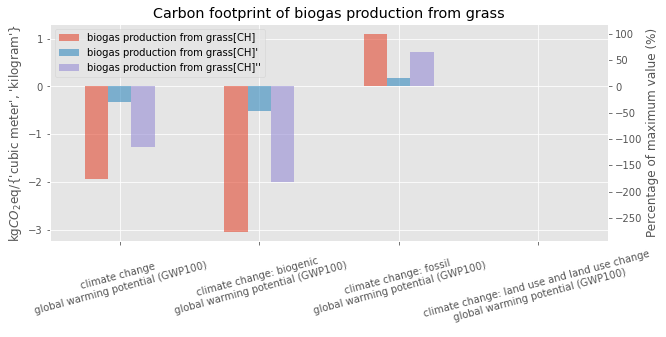

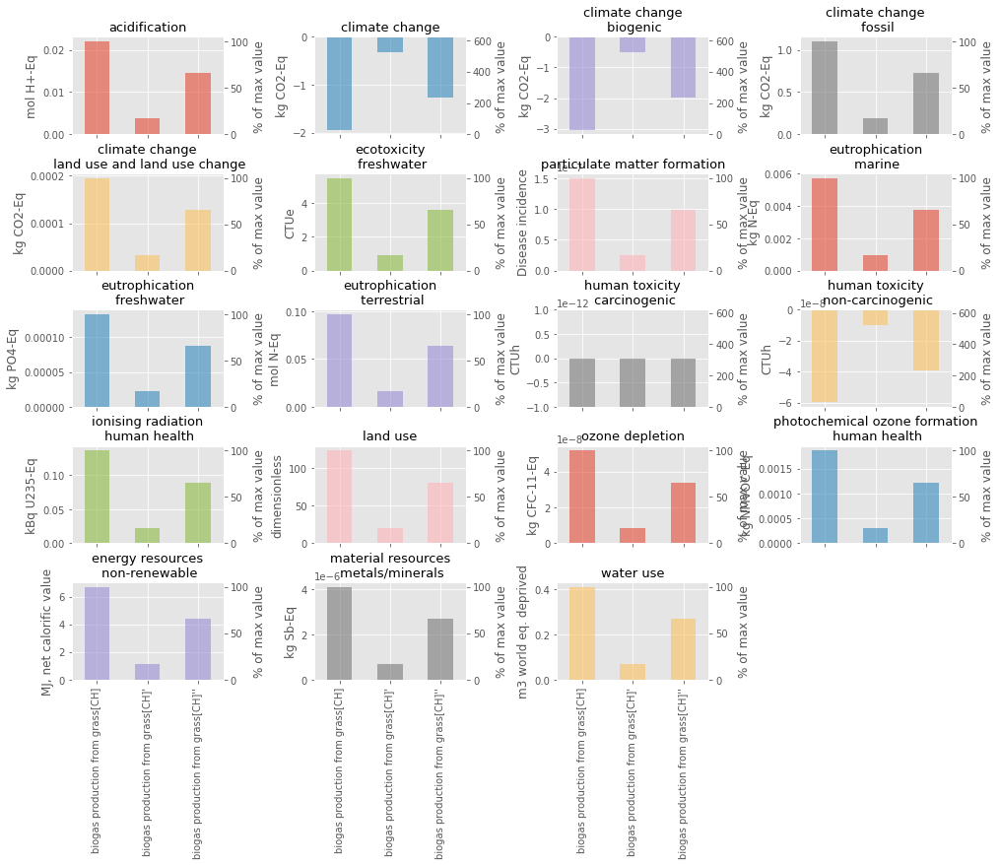

In [57]:
list_act.explore(methods_CC, methods_EF, print_mode = 3, comments = True)

In [56]:
list_act.list_act

['biogas production from grass' (kilogram, CH, None),
 'biogas production from grass' (kilogram, CH, None),
 'biogas production from grass' (cubic meter, CH, None)]

# Rapeseed

In [10]:
list_act = dbex.list_act(database = eidb,
                         name = 'rape seed production')
list_act.explore(strict = False, comments = False)

List of names:


{'rape seed production',
 'rape seed production, Swiss integrated production, extensive',
 'rape seed production, Swiss integrated production, intensive',
 'rape seed production, for sowing',
 'rape seed production, organic',
 'rape seed production, organic, for sowing'}

List of locations:


{'CA-QC', 'CH', 'Canada without Quebec', 'DE', 'FR', 'RoW', 'US'}

List of units:


{'kilogram'}

Error while parsing formula 'NO3-' : backing to amount
Error while parsing formula 'Cu+' : backing to amount
Error while parsing formula 'Cu+' : backing to amount
Error while parsing formula 'CORINE 121a' : backing to amount
Error while parsing formula 'CORINE x' : backing to amount
Error while parsing formula 'CORINE 211b' : backing to amount
Error while parsing formula 'CORINE 211b' : backing to amount
Error while parsing formula 'NO3-' : backing to amount
Error while parsing formula 'CORINE 231a' : backing to amount
Error while parsing formula 'CORINE 211a' : backing to amount
Error while parsing formula 'CORINE 211a' : backing to amount
Error while parsing formula 'Cu+' : backing to amount
Error while parsing formula 'NO3-' : backing to amount
Error while parsing formula 'Cu+' : backing to amount
Error while parsing formula 'CORINE 211a' : backing to amount
Error while parsing formula 'CORINE 211a' : backing to amount
Error while parsing formula 'C5H13ClN+' : backing to amount
Erro

rape seed production[Canada without Quebec] (1.000000 kilogram)  \
                                                                                                       input   
Ammonia                                                                                 Ammonia                
Bentazone                                                                                   NaN                
Bentazone#1                                                                                 NaN                
Bentazone#2                                                                                 NaN                
Bentazone#3                                                                                 NaN                
...                                                                                         ...                
tillage, ploughing                                                market for tillage, ploughing                
tillage, rotary cultivator                                market for tillage, rotary cultivator                
transport, tractor and trailer, agricultural  market for transport, tractor and trailer, agr...                
urea                                                                       market for urea[RNA]                
urea#1                                                                                      NaN                

                                                                       \
                                                amount           unit   
Ammonia                                            H3N       kilogram   
Bentazone                                          NaN            NaN   
Bentazone#1                                        NaN            NaN   
Bentazone#2                                        NaN            NaN   
Bentazone#3                                        NaN            NaN   
...                                                ...            ...   
tillage, ploughing                            0.000132        hectare   
tillage, rotary cultivator                    0.000264        hectare   
transport, tractor and trailer, agricultural     0.002  ton kilometer   
urea                                          0.050973       kilogram   
urea#1                                             NaN            NaN   

                                             rape seed production, organic, for sowing[CH] (1.000000 kilogram)  \
                                                                                                         input   
Ammonia                                                                                     NaN                  
Bentazone                                                                                   NaN                  
Bentazone#1                                                                                 NaN                  
Bentazone#2                                                                                 NaN                  
Bentazone#3                                                                                 NaN                  
...                                                                                         ...                  
tillage, ploughing                                                                          NaN                  
tillage, rotary cultivator                                                                  NaN                  
transport, tractor and trailer, agricultural                                                NaN                  
urea                                                                                        NaN                  
urea#1                                                                                      NaN                  

                                                          \
                                             amount unit   
Ammonia                            

All flows:


,rape seed production_Canada without Quebec,"rape seed production, organic, for sowing_CH","rape seed production, organic_RoW",rape seed production_DE,rape seed production_FR,rape seed production_US,rape seed production_CA-QC,rape seed production_RoW,"rape seed production, organic, for sowing_RoW","rape seed production, Swiss integrated production, extensive_CH","rape seed production, for sowing_CH","rape seed production, for sowing_RoW","rape seed production, Swiss integrated production, intensive_CH","rape seed production, organic_CH"
market for drying of feed grain,0.058275,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"market for tillage, ploughing",0.000132,NaN,0.000494,0.000286,0.000166,0.000169,NaN,0.000228,NaN,NaN,NaN,NaN,NaN,NaN
"market for fertilising, by broadcaster",0.000792,NaN,NaN,0.000666,0.000828,0.002537,NaN,0.000856,NaN,NaN,NaN,NaN,NaN,NaN
"market for solid manure loading and spreading, by hydraulic loader and spreader",1.230802,NaN,14.829,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
market for sowing,0.000528,NaN,0.000494,0.000286,0.000331,0.000846,NaN,0.000341,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"rape seed production, for sowing",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN
"rape seed production, Swiss integrated production, intensive",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN
"market for phosphate rock, beneficiated",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.005412,NaN
"tillage, currying, by weeder",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000494


Technosphere flows:


,rape seed production_Canada without Quebec,"rape seed production, organic, for sowing_CH","rape seed production, organic_RoW",rape seed production_DE,rape seed production_FR,rape seed production_US,rape seed production_CA-QC,rape seed production_RoW,"rape seed production, organic, for sowing_RoW","rape seed production, Swiss integrated production, extensive_CH","rape seed production, for sowing_CH","rape seed production, for sowing_RoW","rape seed production, Swiss integrated production, intensive_CH","rape seed production, organic_CH"
market for drying of feed grain,0.058275,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"market for tillage, ploughing",0.000132,NaN,0.000494,0.000286,0.000166,0.000169,NaN,0.000228,NaN,NaN,NaN,NaN,NaN,NaN
"market for fertilising, by broadcaster",0.000792,NaN,NaN,0.000666,0.000828,0.002537,NaN,0.000856,NaN,NaN,NaN,NaN,NaN,NaN
"market for solid manure loading and spreading, by hydraulic loader and spreader",1.230802,NaN,14.829,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
market for sowing,0.000528,NaN,0.000494,0.000286,0.000331,0.000846,NaN,0.000341,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"tillage, harrowing, by spring tine harrow",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000745,NaN,NaN,0.000643,0.000989
market for rape seed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.75,1.75,NaN,NaN
"market for phosphate rock, beneficiated",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.005412,NaN
"tillage, currying, by weeder",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000494


Biosphere flows:


,rape seed production_Canada without Quebec,"rape seed production, organic, for sowing_CH","rape seed production, organic_RoW",rape seed production_DE,rape seed production_FR,rape seed production_US,rape seed production_CA-QC,rape seed production_RoW,"rape seed production, organic, for sowing_RoW","rape seed production, Swiss integrated production, extensive_CH","rape seed production, for sowing_CH","rape seed production, for sowing_RoW","rape seed production, Swiss integrated production, intensive_CH","rape seed production, organic_CH"
"Zinc, ion",0.000014,NaN,NaN,0.000004,0.000006,0.000008,0.000151,0.000005,NaN,0.000012,NaN,NaN,0.00001,NaN
Phosphate,0.000421,NaN,0.000396,0.000061,0.000284,0.000951,0.000371,0.000212,NaN,0.000353,NaN,NaN,0.000411,0.000396
Cadmium,-0.000001,NaN,-0.000001,0.0,0.000002,0.0,-0.000001,0.000001,NaN,-0.0,NaN,NaN,-0.0,-0.000001
Chromium,-0.0,NaN,0.000012,0.000003,0.000007,-0.000001,-0.000032,0.000004,NaN,-0.000003,NaN,NaN,0.000004,0.000012
Copper,0.000016,NaN,0.000075,-0.0,-0.0,-0.000001,-0.000007,-0.0,NaN,0.000023,NaN,NaN,0.000018,0.000075
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Bentazone,NaN,NaN,NaN,NaN,NaN,NaN,0.000017,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"Fungicides, unspecified",NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"Herbicides, unspecified",NaN,NaN,NaN,NaN,NaN,NaN,0.000045,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Carbetamide,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000089,NaN,NaN,0.00019,NaN


Carbon footprint:


,climate change\nglobal warming potential (GWP100),climate change: biogenic\nglobal warming potential (GWP100),climate change: fossil\nglobal warming potential (GWP100),climate change: land use and land use change\nglobal warming potential (GWP100)
rape seed production[Canada without Quebec],-0.619953,-1.594562,0.963794,0.010815
"rape seed production, organic, for sowing[CH]",-1.548109,-3.471675,1.922516,0.001051
"rape seed production, organic[RoW]",-0.934832,-1.984564,1.049378,0.000354
rape seed production[DE],-1.228130,-1.916624,0.687869,0.000626
rape seed production[FR],-0.934132,-1.897540,0.962676,0.000733
rape seed production[US],-0.185707,-1.989289,1.802518,0.001063
rape seed production[CA-QC],-0.764513,-1.922495,1.147941,0.010042
rape seed production[RoW],-0.967060,-1.982020,1.014255,0.000705
"rape seed production, organic, for sowing[RoW]",-1.508934,-3.472514,1.962444,0.001136
"rape seed production, Swiss integrated production, extensive[CH]",-1.173061,-1.977463,0.804117,0.000285


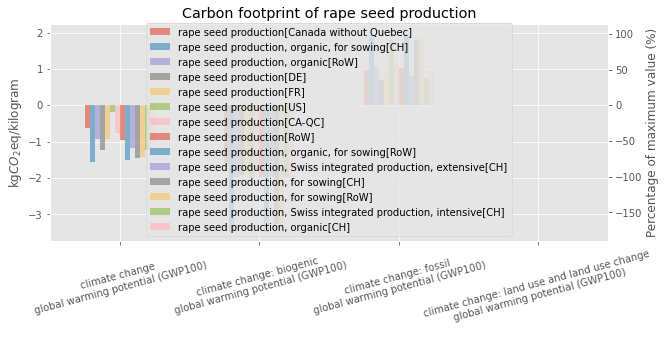

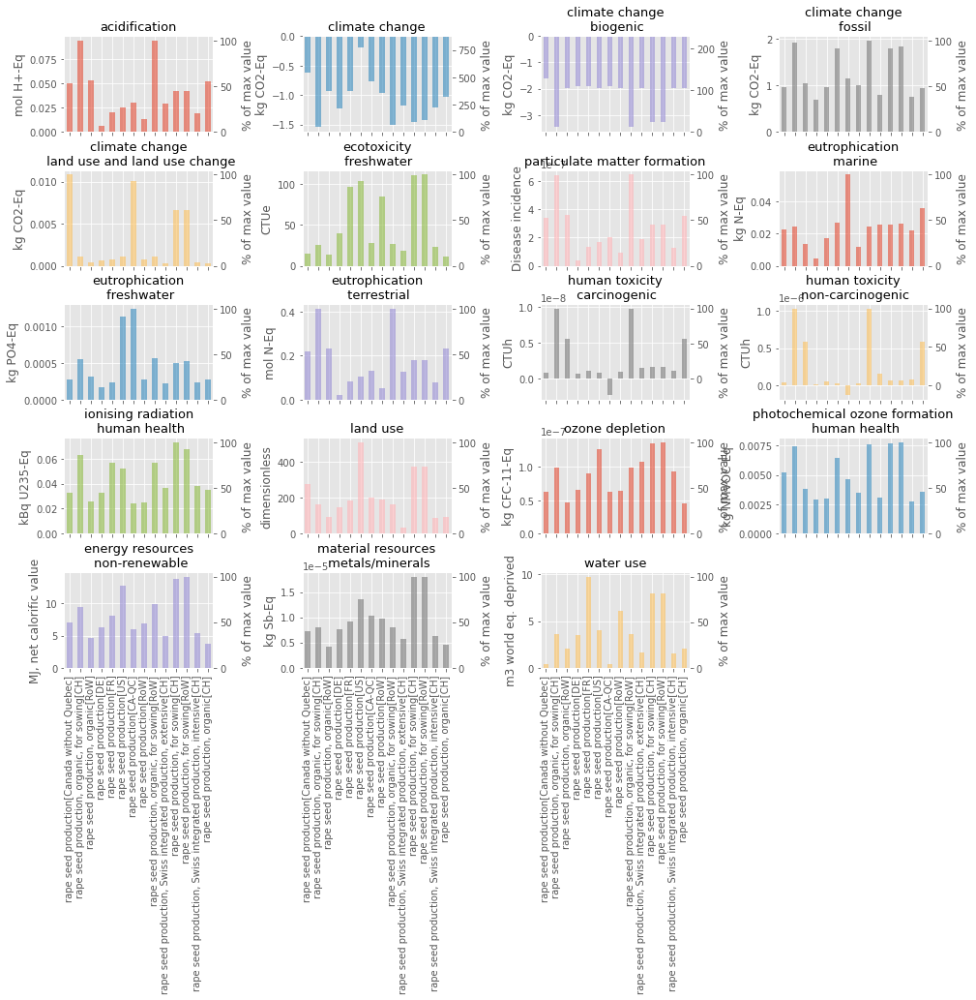

In [11]:
list_act.analyse(methods_CC, methods_EF, print_mode = 3)

In [13]:
pd.set_option('display.max_rows', 500)

In [14]:
list_act.DFt

,rape seed production_Canada without Quebec,"rape seed production, organic, for sowing_CH","rape seed production, organic_RoW",rape seed production_DE,rape seed production_FR,rape seed production_US,rape seed production_CA-QC,rape seed production_RoW,"rape seed production, organic, for sowing_RoW","rape seed production, Swiss integrated production, extensive_CH","rape seed production, for sowing_CH","rape seed production, for sowing_RoW","rape seed production, Swiss integrated production, intensive_CH","rape seed production, organic_CH"
market for drying of feed grain,0.058275,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"market for tillage, ploughing",0.000132,NaN,0.000494,0.000286,0.000166,0.000169,NaN,0.000228,NaN,NaN,NaN,NaN,NaN,NaN
"market for fertilising, by broadcaster",0.000792,NaN,NaN,0.000666,0.000828,0.002537,NaN,0.000856,NaN,NaN,NaN,NaN,NaN,NaN
"market for solid manure loading and spreading, by hydraulic loader and spreader",1.230802,NaN,14.829,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
market for sowing,0.000528,NaN,0.000494,0.000286,0.000331,0.000846,NaN,0.000341,NaN,NaN,NaN,NaN,NaN,NaN
"market for packaging, for fertilisers",0.115449,NaN,NaN,0.121,0.23088,0.302945,0.152036,0.178549,NaN,0.050574,NaN,NaN,0.081671,NaN
"market for liquid manure spreading, by vacuum tanker",0.001727,NaN,0.009886,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"market for packaging, for pesticides",0.001092,NaN,NaN,0.000727,0.001883,0.001067,0.006155,0.001229,NaN,0.00208,NaN,NaN,0.001561,NaN
market for combine harvesting,0.000528,NaN,0.000494,0.000286,0.000331,0.000737,NaN,0.000334,NaN,NaN,NaN,NaN,NaN,NaN
"market for land use change, annual crop",0.00031,NaN,NaN,NaN,NaN,NaN,0.000284,NaN,NaN,NaN,NaN,NaN,NaN,NaN
